In [1]:
import os

def crear_carpeta(nombre_carpeta):
    if not os.path.exists(nombre_carpeta):
        os.makedirs(nombre_carpeta)
        print(f"Carpeta '{nombre_carpeta}' creada exitosamente.")

carpeta1 = "hough_recortes"
carpeta2 = "recortes"
carpeta3 = "recortes_texto"
carpeta4 = "Pacientes"

crear_carpeta(carpeta1)
crear_carpeta(carpeta2)
crear_carpeta(carpeta3)
crear_carpeta(carpeta4)

Carpeta 'hough_recortes' creada exitosamente.
Carpeta 'recortes' creada exitosamente.
Carpeta 'recortes_texto' creada exitosamente.
Carpeta 'Pacientes' creada exitosamente.


In [2]:
!git clone https://github.com/Nietsabas/Introduccion-Imagenes

Cloning into 'Introduccion-Imagenes'...
remote: Enumerating objects: 670, done.
remote: Counting objects: 100% (670/670), done.
remote: Compressing objects: 100% (667/667), done.
remote: Total 670 (delta 2), reused 670 (delta 2), pack-reused 0
Receiving objects: 100% (670/670), 17.85 MiB | 12.11 MiB/s, done.
Resolving deltas: 100% (2/2), done.


In [3]:
%cd Introduccion-Imagenes

/content/Introduccion-Imagenes


In [3]:
!pip install pydicom

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 18.8 MB/s eta 0:00:00


In [4]:
import os
import cv2
import numpy as np
import pydicom
import shutil


from skimage.transform import (hough_line, hough_line_peaks,
                               probabilistic_hough_line)
from skimage.feature import canny
from skimage import data
from google.colab import files

import numpy as np
import matplotlib.pyplot as plt

from google.colab.patches import cv2_imshow

In [6]:
imagens_sample = [
'Imagenes DICOM/LAQJ4RO2',
'Imagenes DICOM/LAQJNQ82',
'Imagenes DICOM/LAQJPMG2',
'Imagenes DICOM/LAQJ3N02'
,
'Imagenes DICOM/LAQJKSG2',
'Imagenes DICOM/LAQJJO02'
]
imagens_sample = []

In [7]:
def save_cut(archivo,imagen, horizontales, verticales,ruta):
  horizontales.append(0)
  verticales.append(0)
  horizontales.sort()
  verticales.sort()
  for x in range(1,len(horizontales)):
    for y in range(1,len(verticales)):
      imagen_recortada = imagen[verticales[y-1]:verticales[y], horizontales[x-1]:horizontales[x]]
      if len(np.shape(imagen_recortada)) == 3:
        alto, ancho, _ = np.shape(imagen_recortada)
      if len(np.shape(imagen_recortada)) == 2:
        alto, ancho = np.shape(imagen_recortada)
      if alto*ancho > 5000:
        ruta_recortada = f"{ruta}{archivo}{horizontales[x]}{verticales[y]}{horizontales[x-1]}{verticales[y-1]}.png"
        cv2.imwrite(ruta_recortada, imagen_recortada)

Imagenes DICOM/LAQISAO2


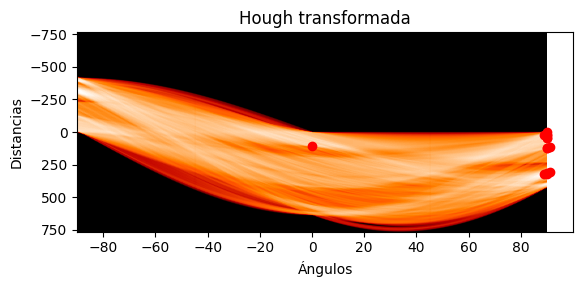

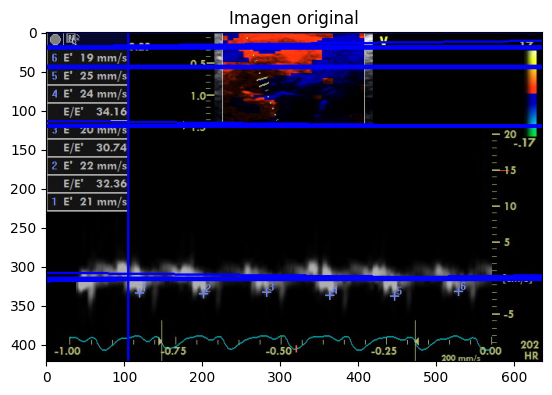

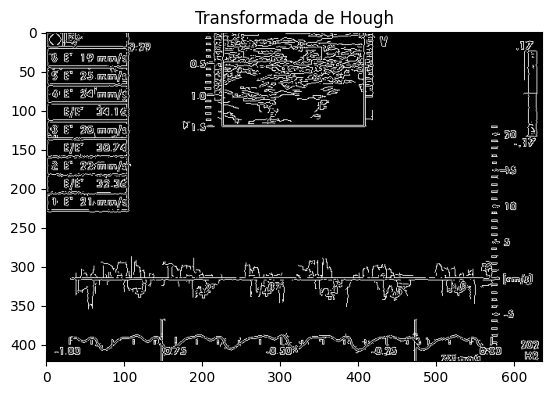

Imagenes DICOM/LAQIS1G2


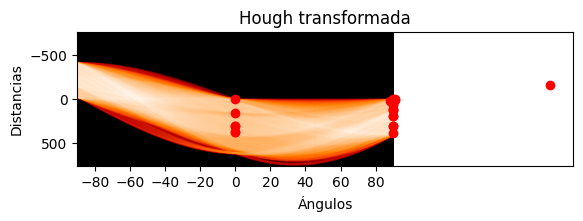

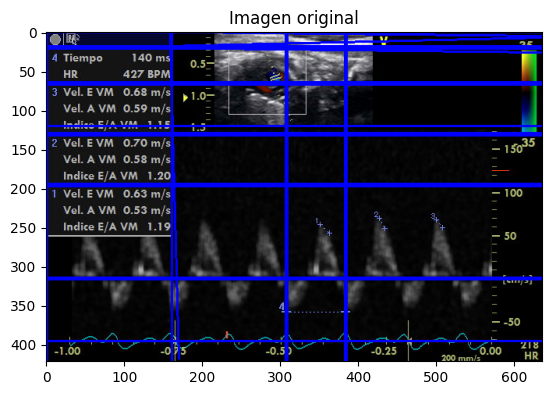

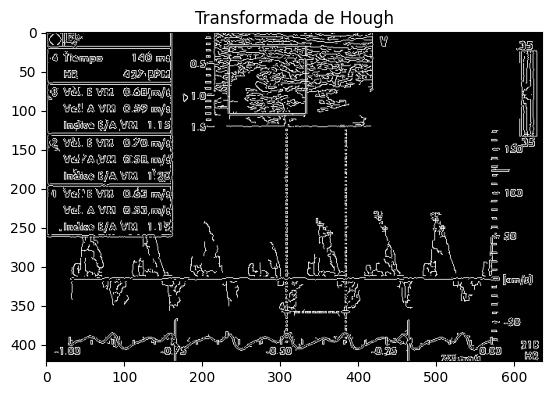

Imagenes DICOM/LAQJ3N02


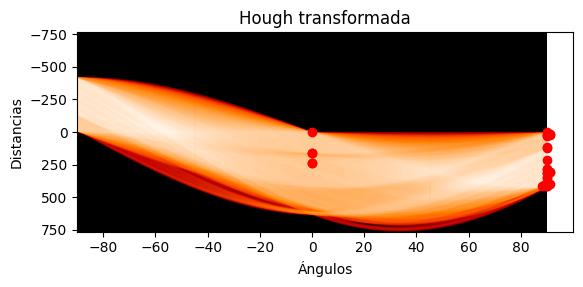

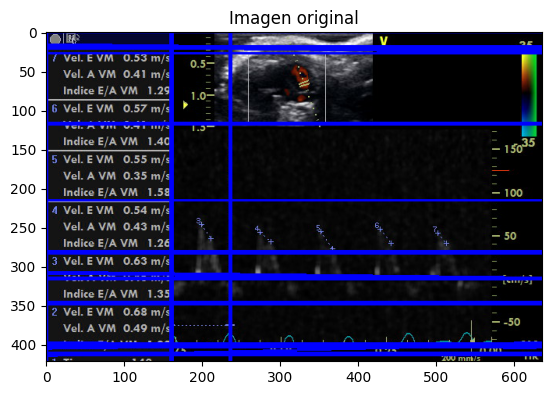

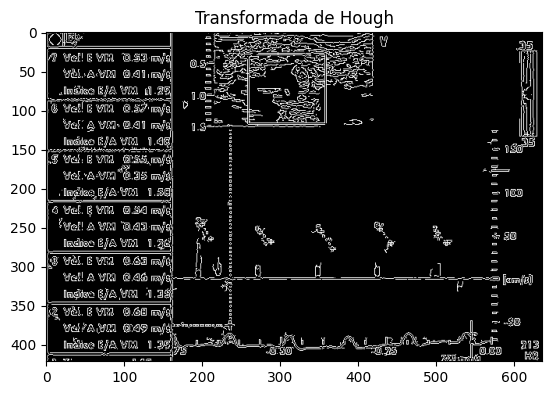

Imagenes DICOM/LAQJP7G2


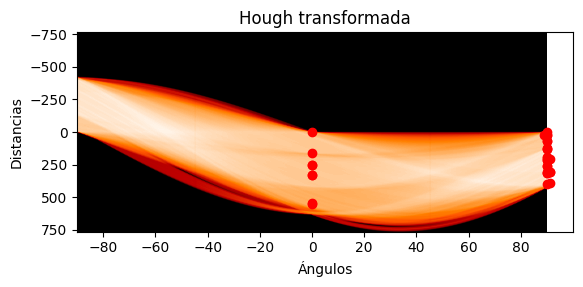

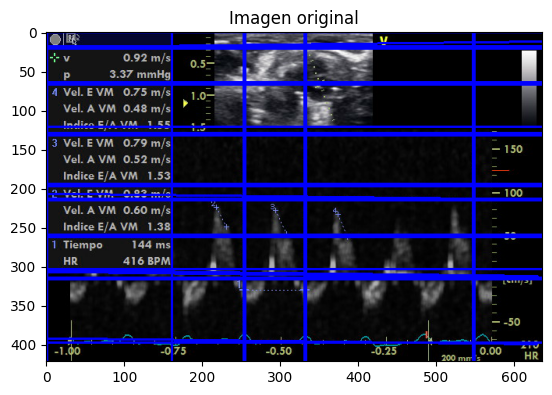

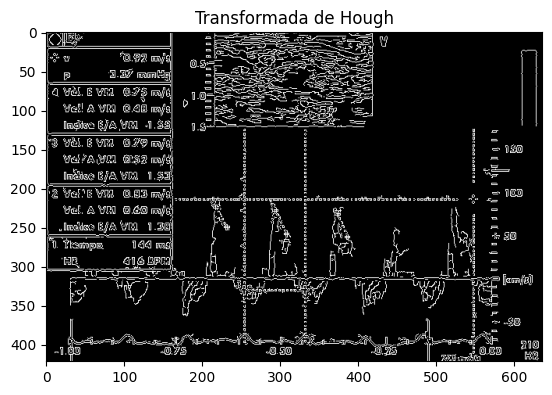

Imagenes DICOM/LAQJ42G2


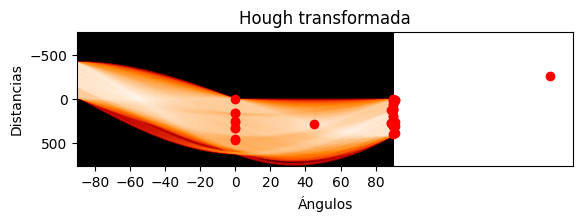

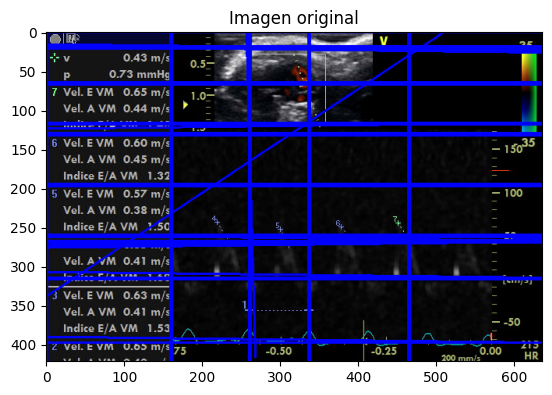

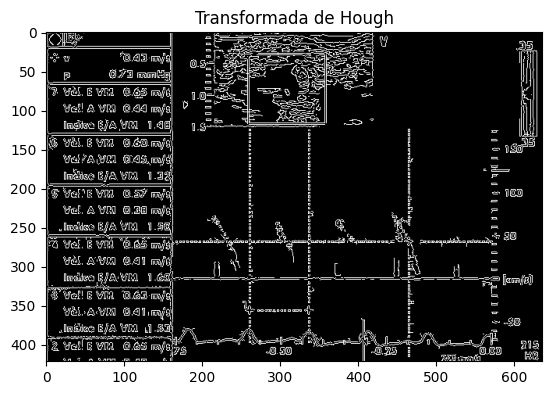

Imagenes DICOM/LAQJFG82


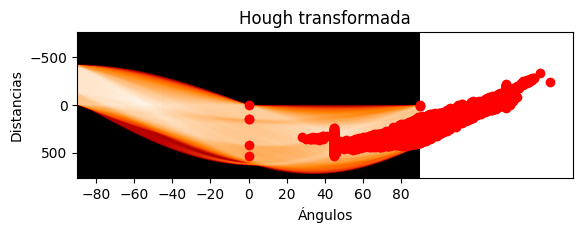

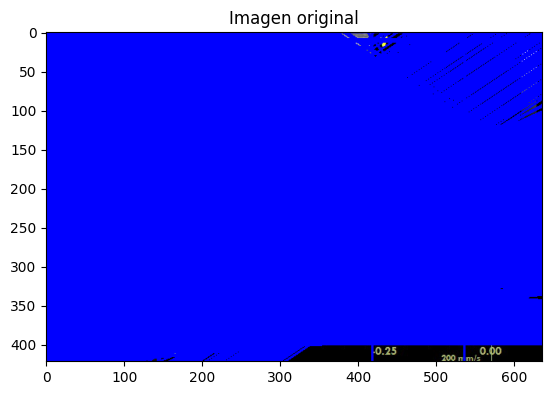

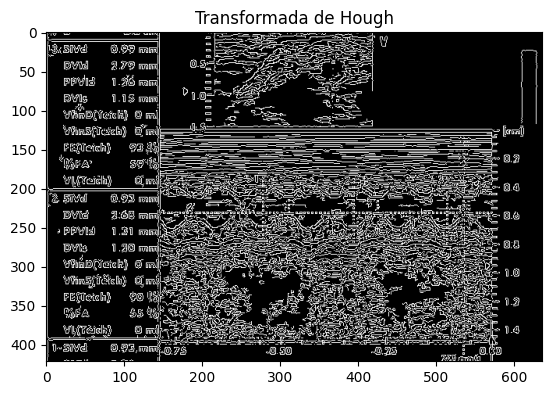

Imagenes DICOM/LAQK5S02


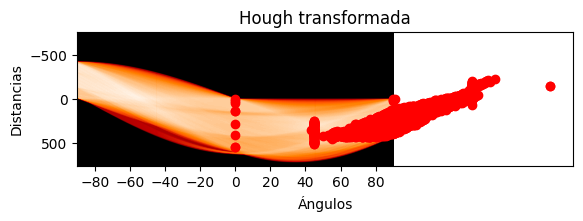

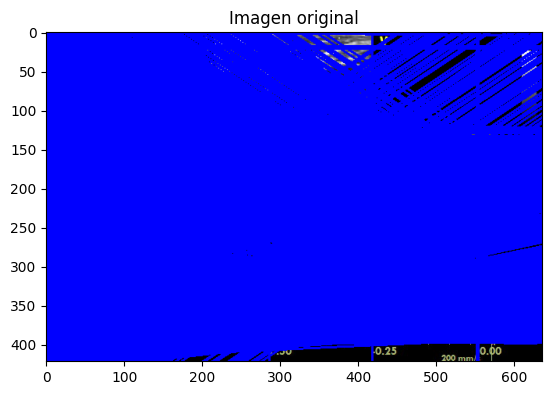

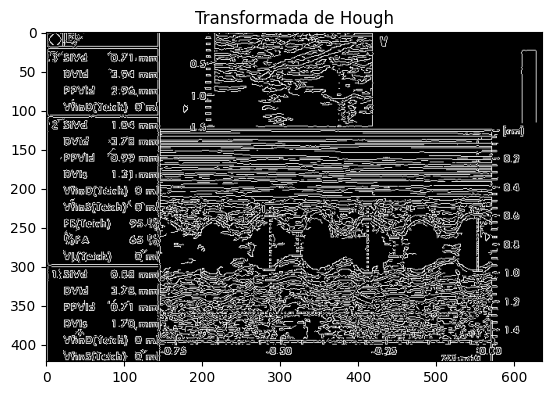

Imagenes DICOM/LAQJ8OO2


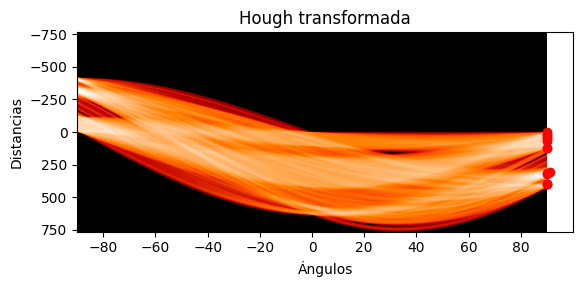

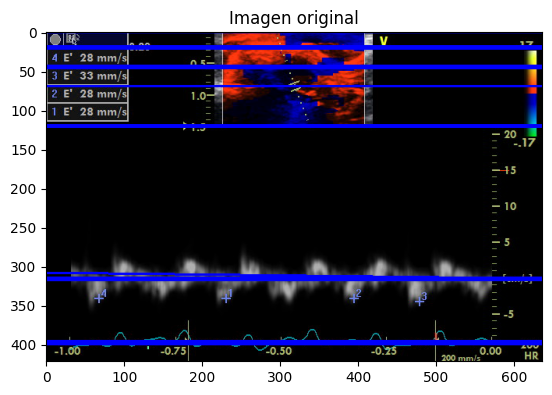

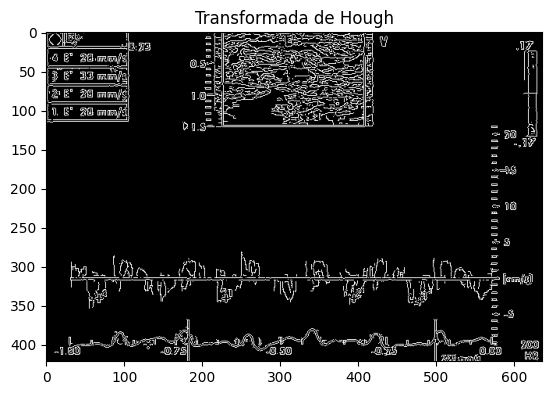

Imagenes DICOM/LAQJ6DO2


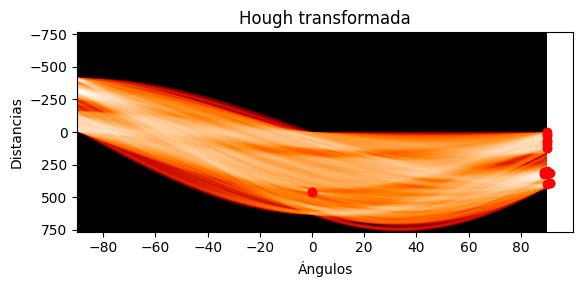

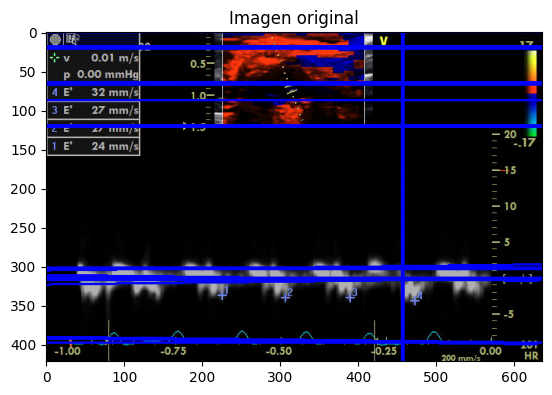

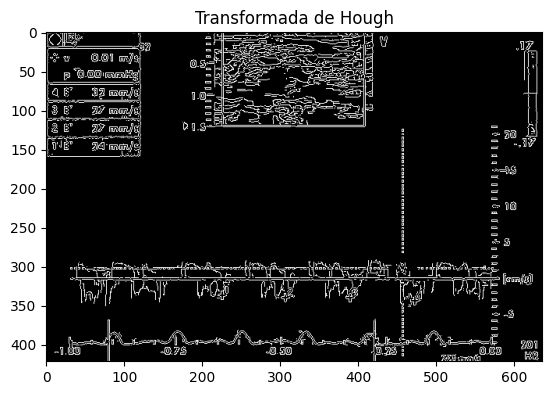

Imagenes DICOM/LAQJTLO2


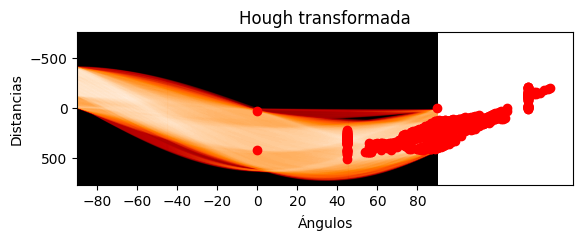

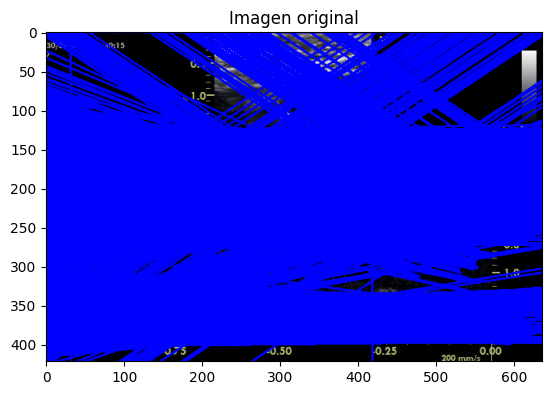

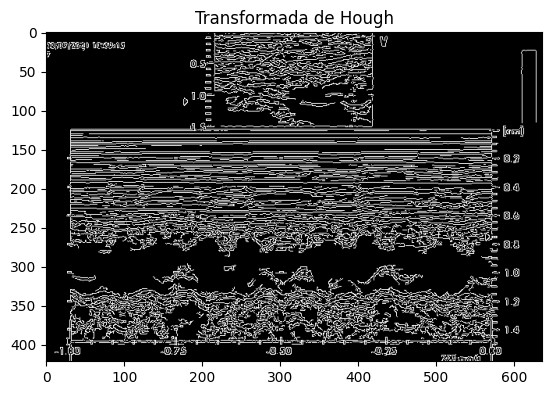

Imagenes DICOM/LAQIOOG2


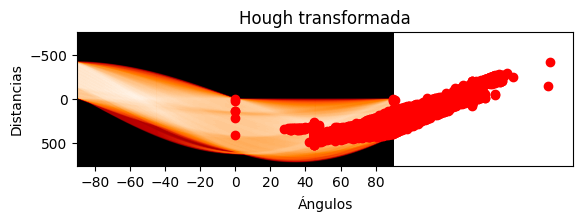

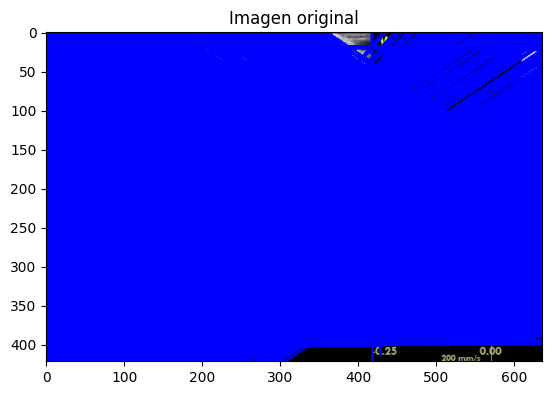

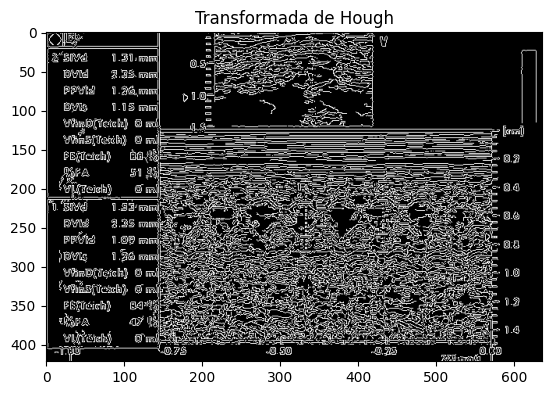

Imagenes DICOM/LAQK5P82


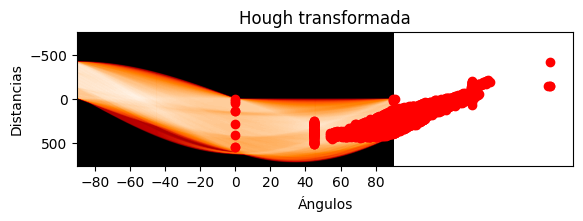

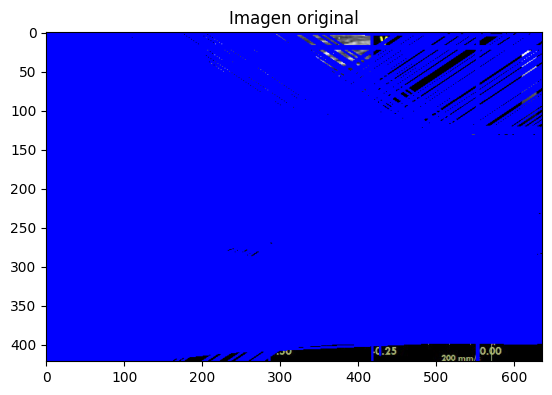

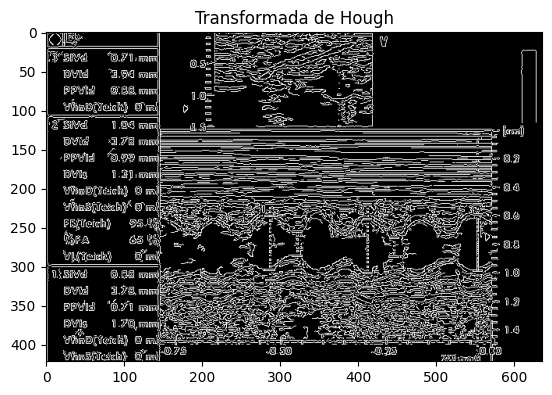

Imagenes DICOM/LAQJ2982


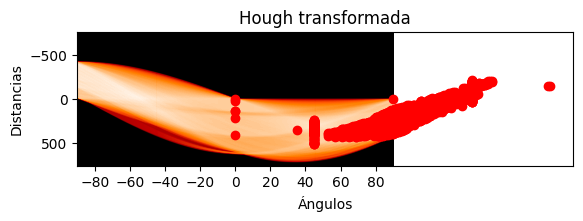

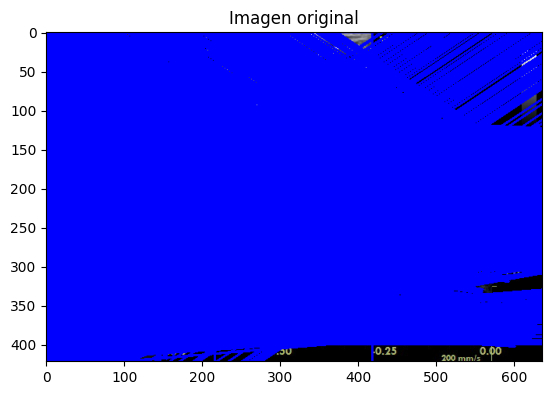

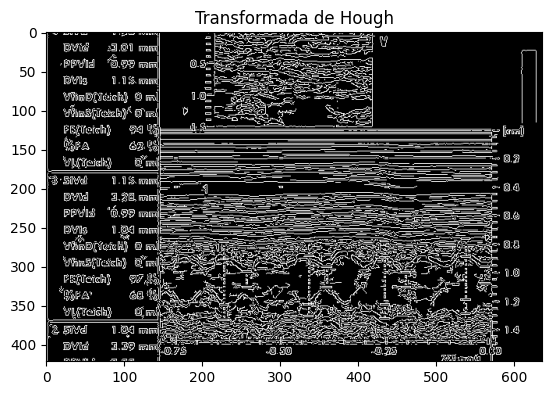

Imagenes DICOM/LAQJJO02


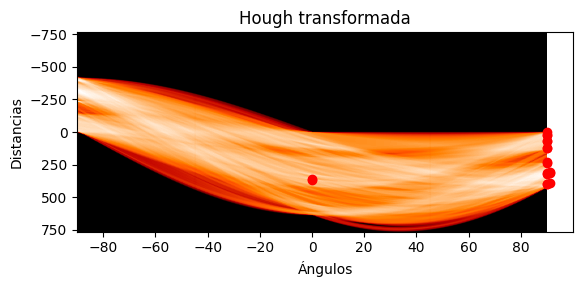

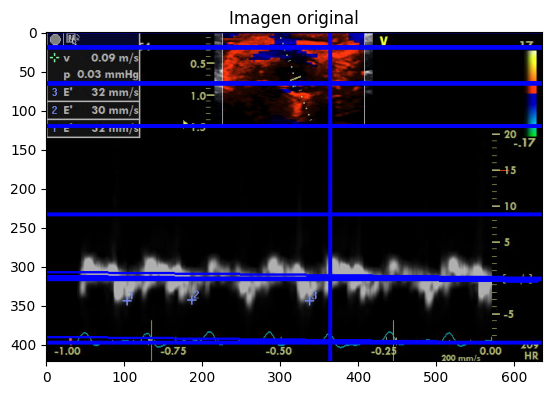

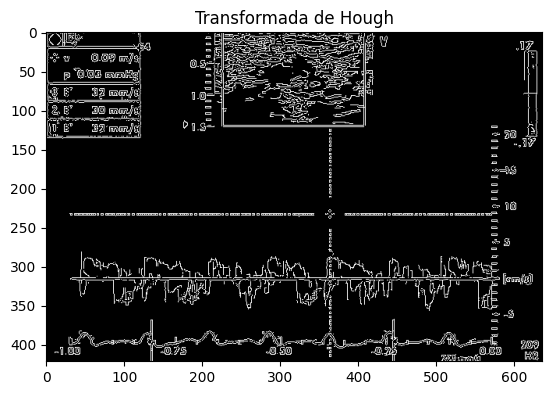

Imagenes DICOM/LAQJKSG2


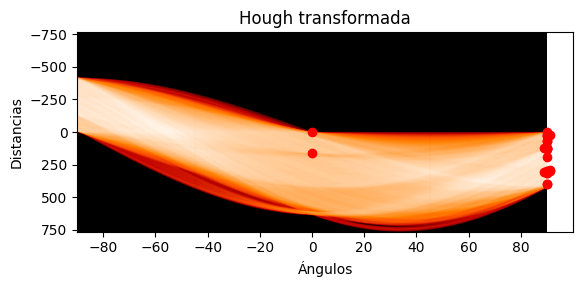

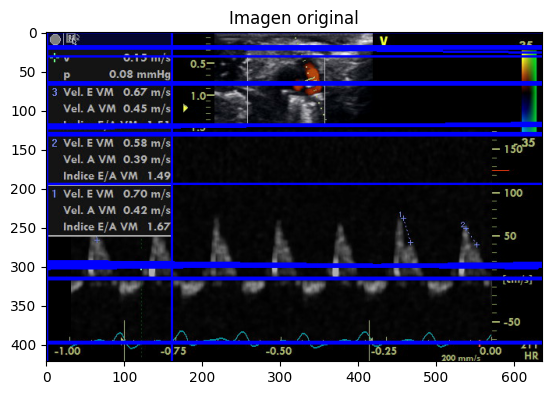

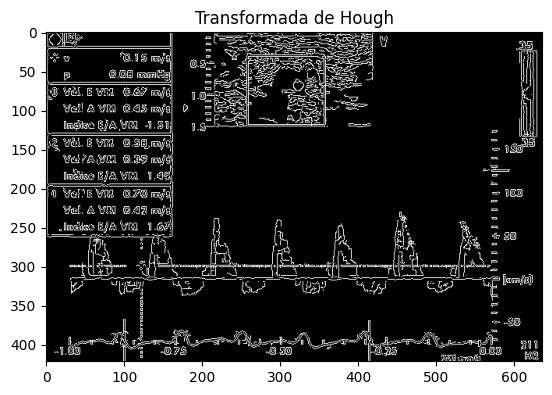

Imagenes DICOM/LAQIQ282


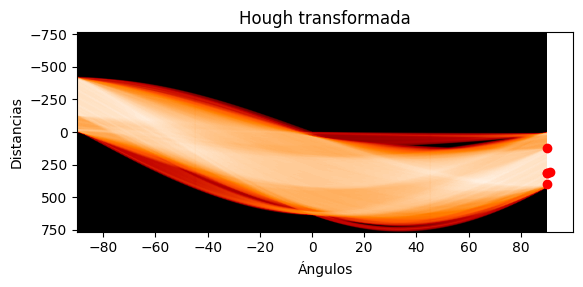

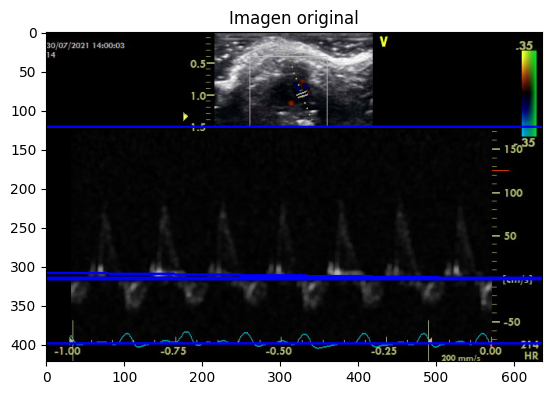

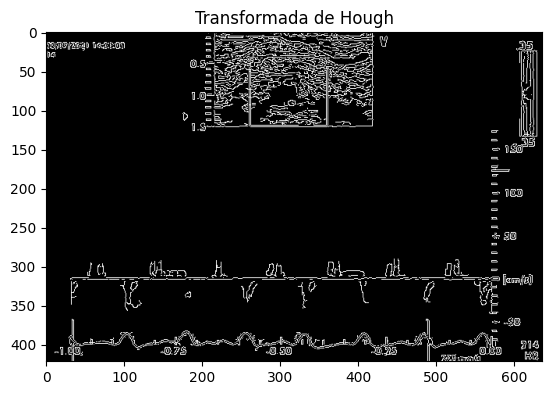

Imagenes DICOM/LAQJ1I82


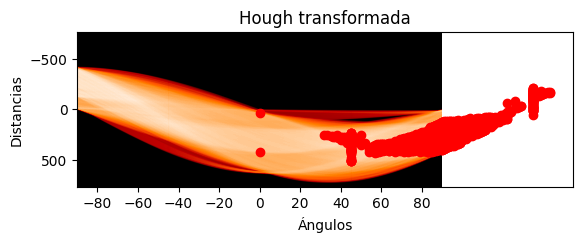

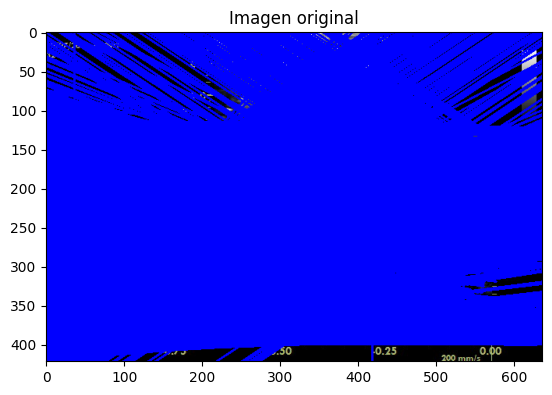

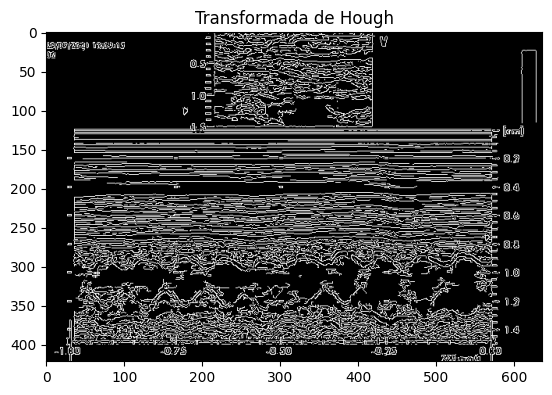

Imagenes DICOM/LAQJPMG2


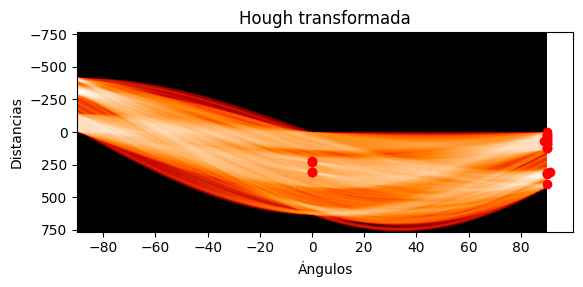

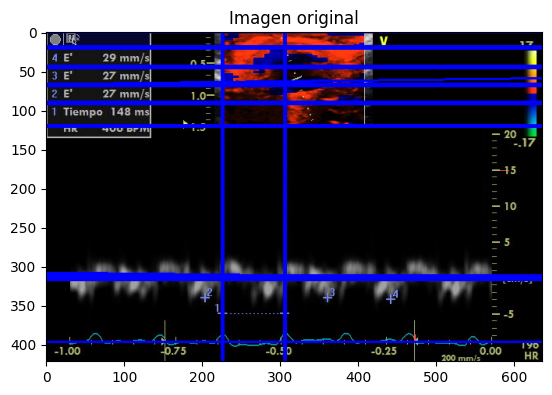

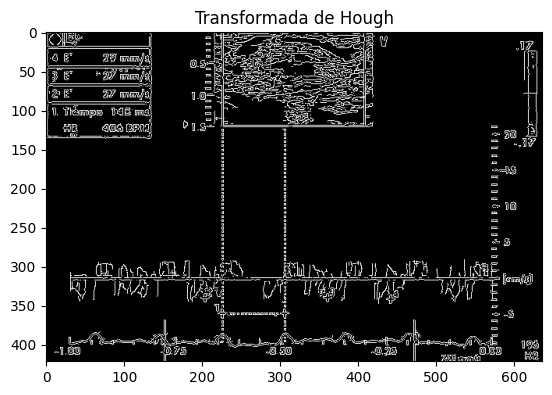

Imagenes DICOM/LAQIP602


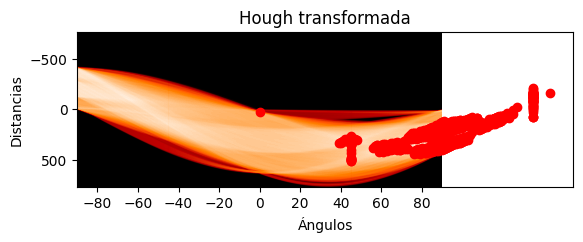

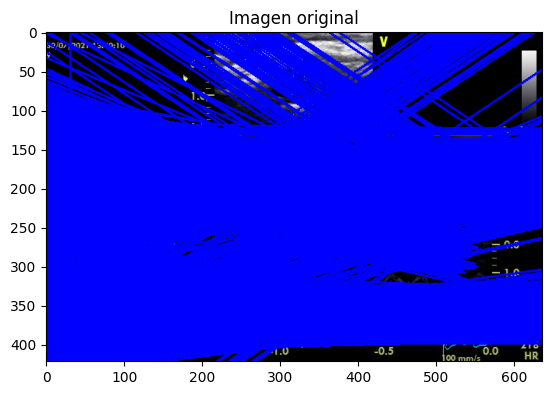

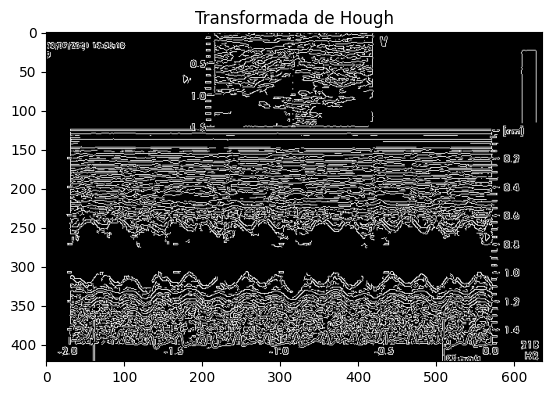

Imagenes DICOM/LAQJ7QO2


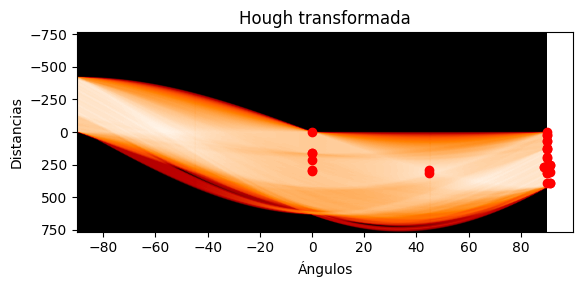

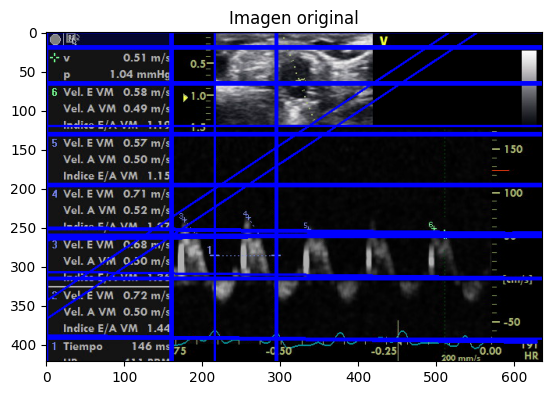

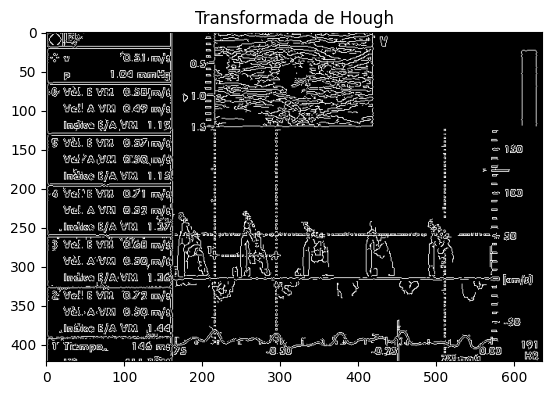

Imagenes DICOM/LAQIP682


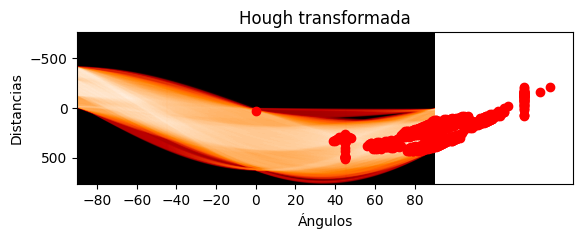

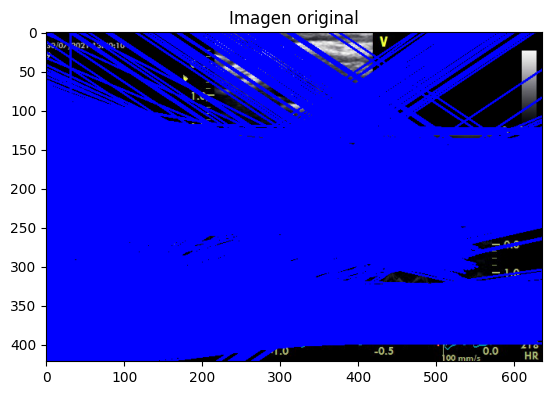

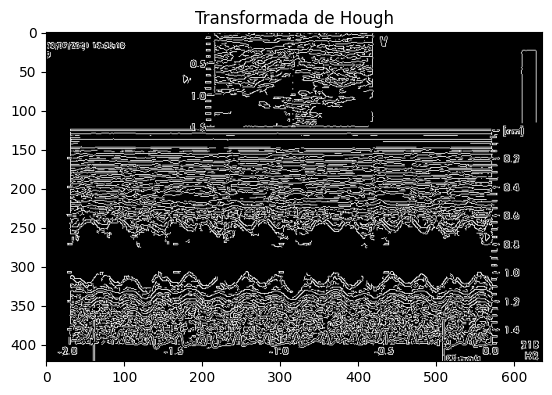

Imagenes DICOM/LAQJJAG2


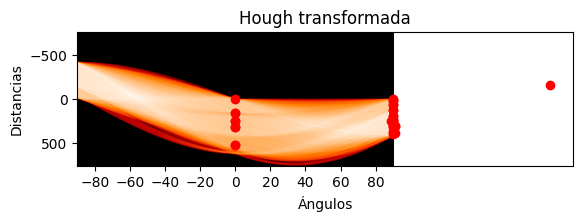

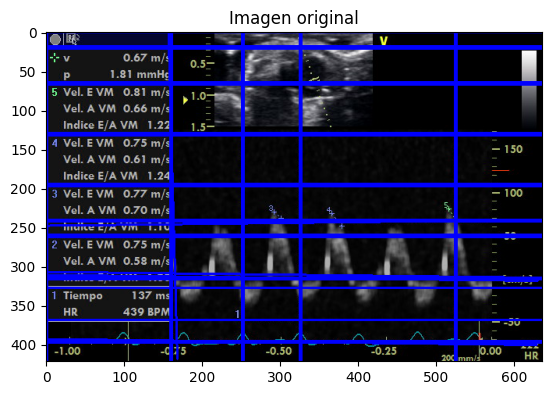

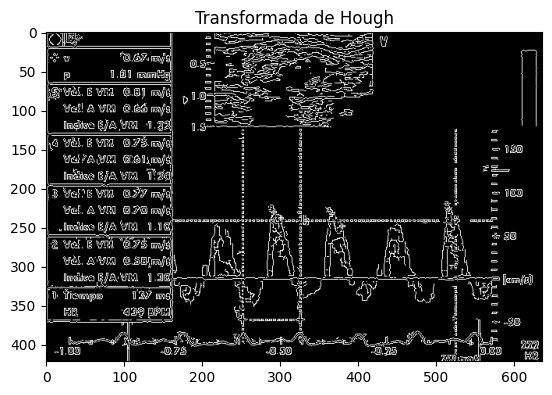

Imagenes DICOM/LAQINS02


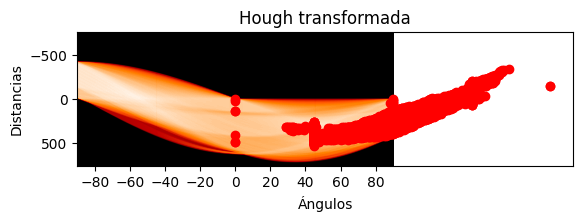

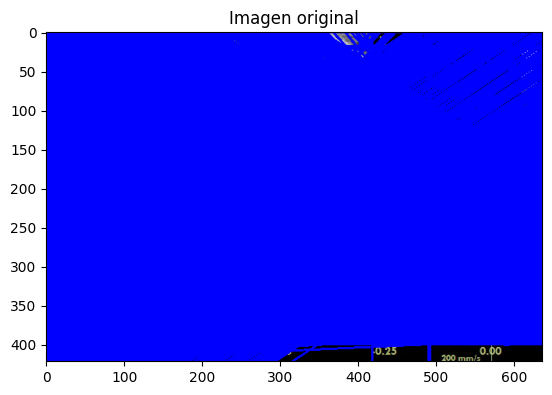

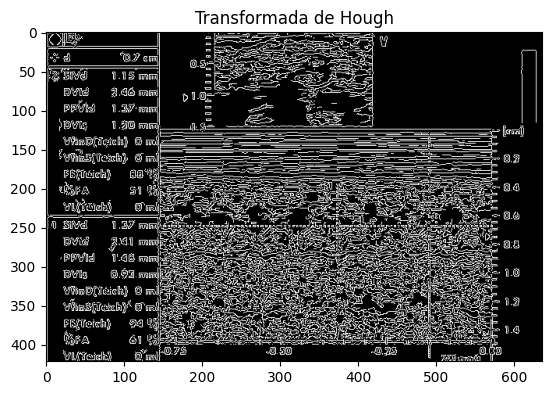

Imagenes DICOM/LAQJHQO2


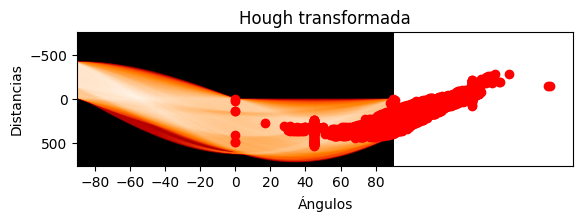

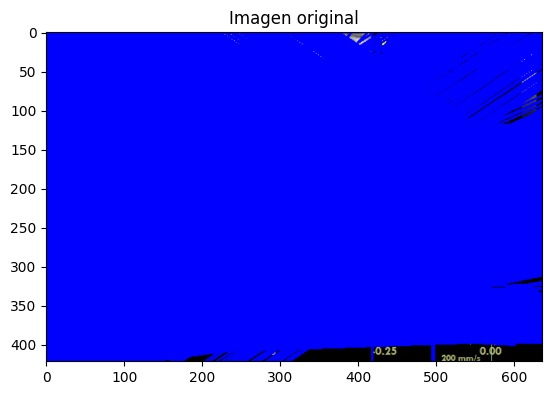

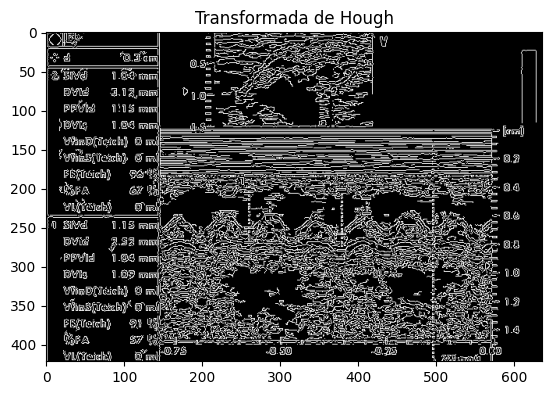

Imagenes DICOM/LAQINK82


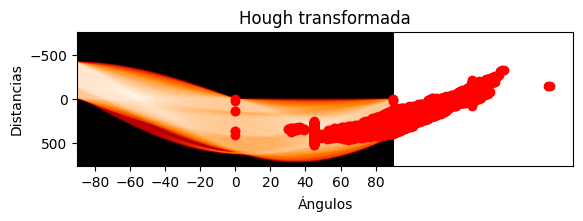

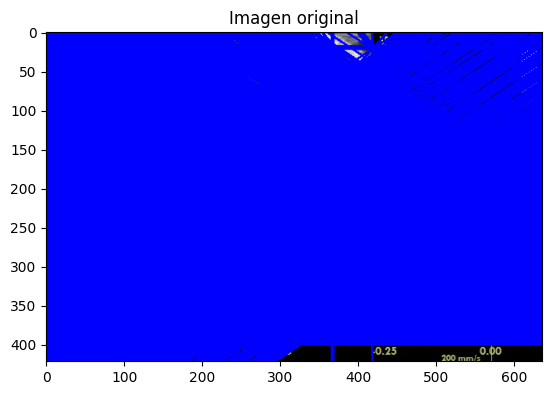

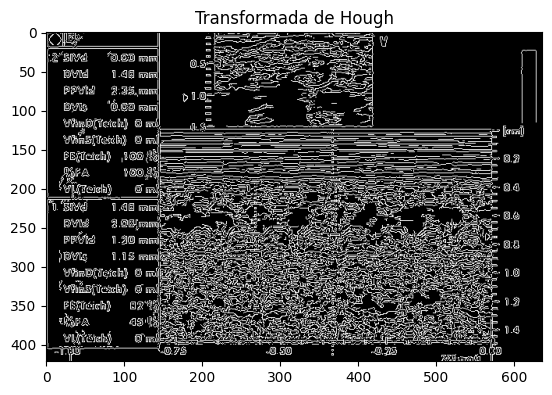

Imagenes DICOM/LAQINRO2


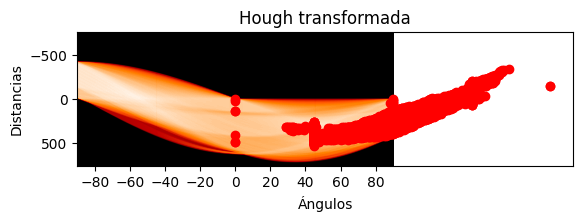

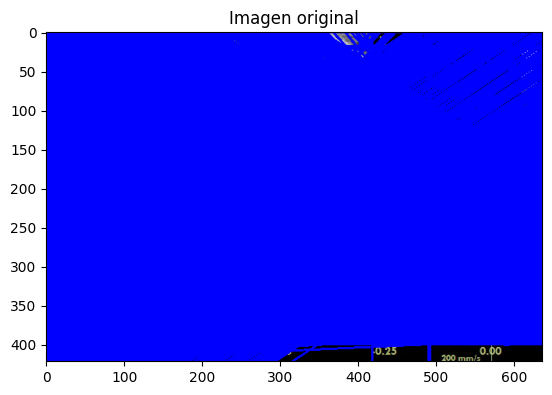

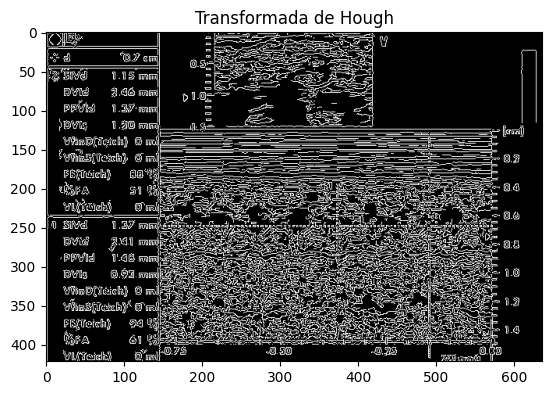

Imagenes DICOM/LAQJF282


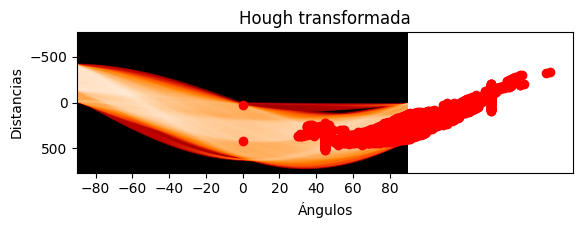

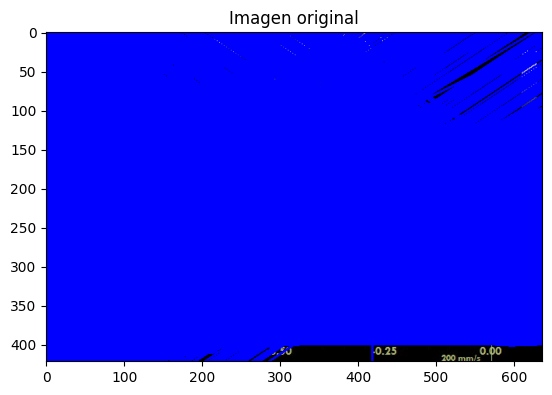

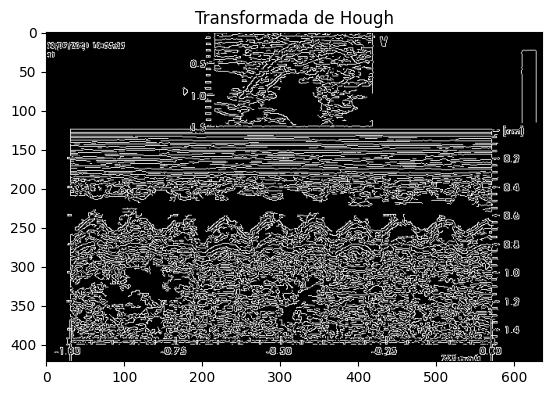

Imagenes DICOM/LAQJ8B02


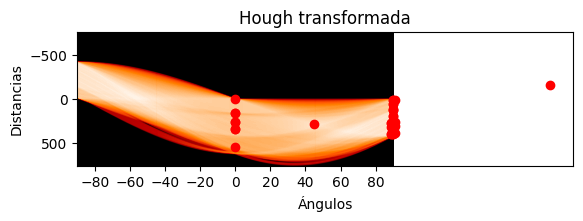

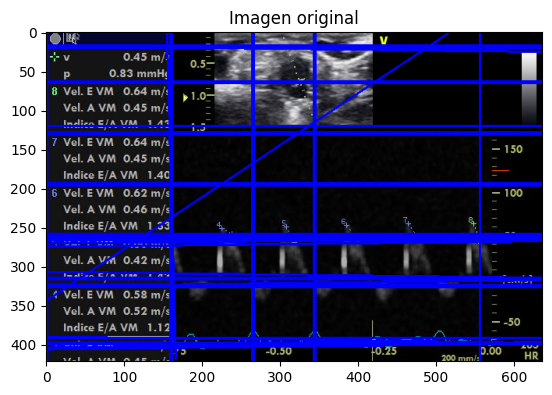

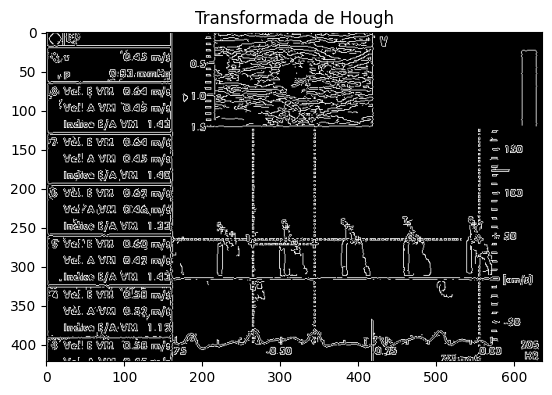

Imagenes DICOM/LAQIQ202


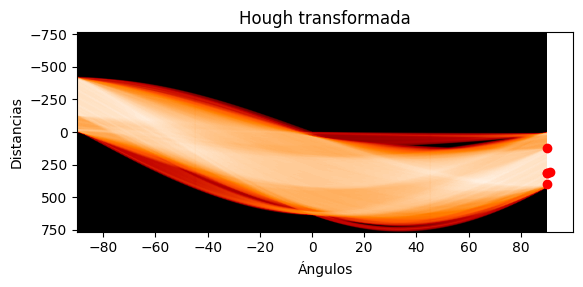

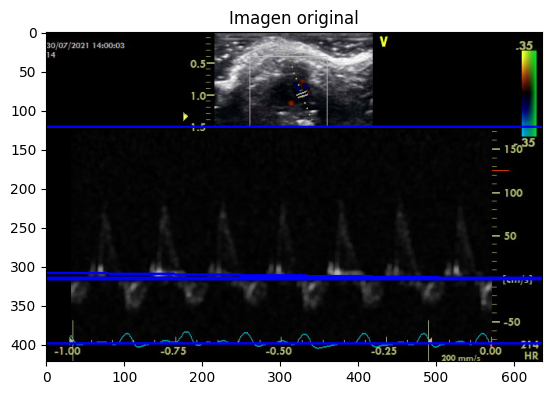

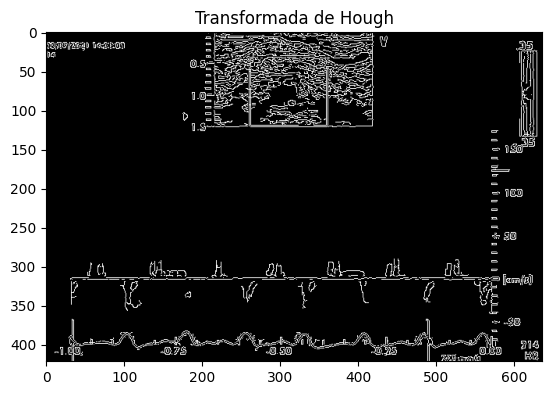

Imagenes DICOM/LAQJNQ82


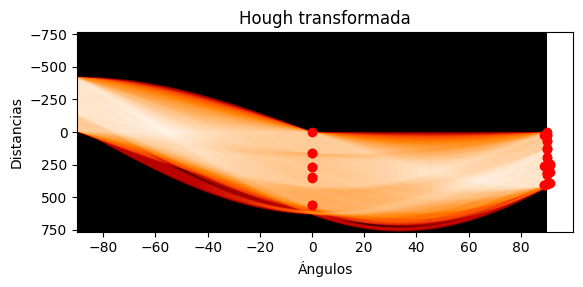

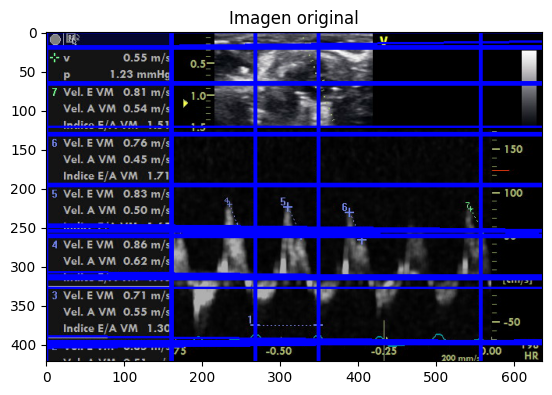

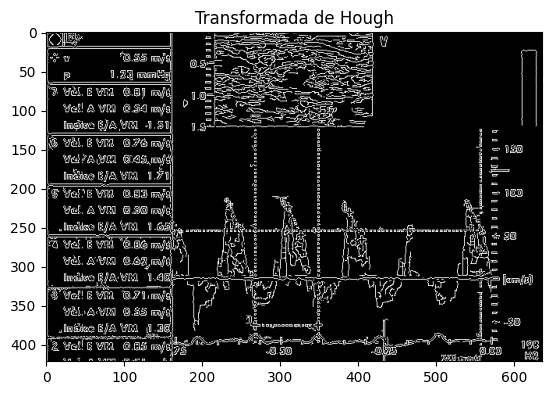

Imagenes DICOM/LAQJ9982


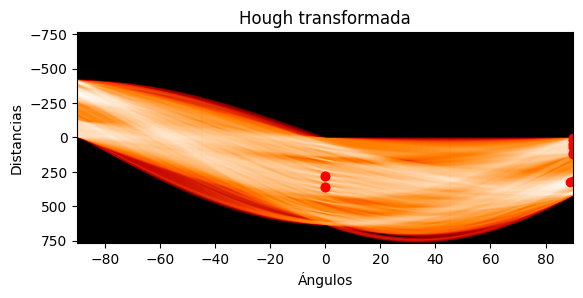

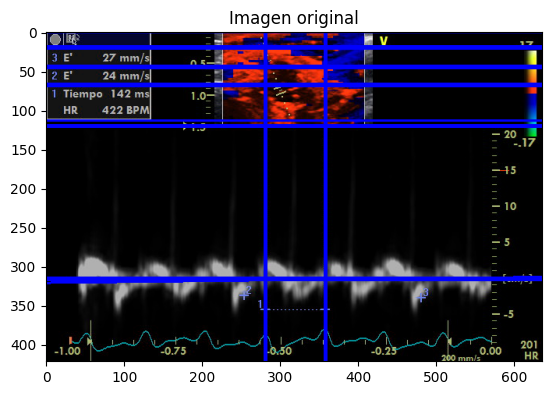

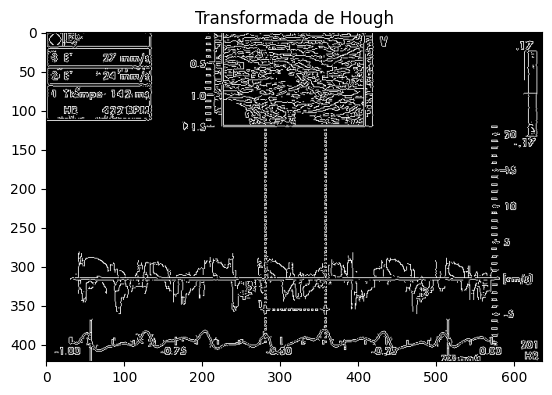

Imagenes DICOM/LAQJQR82


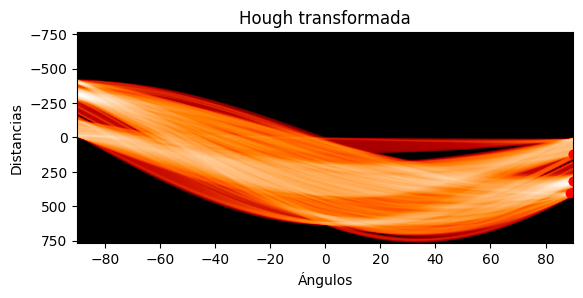

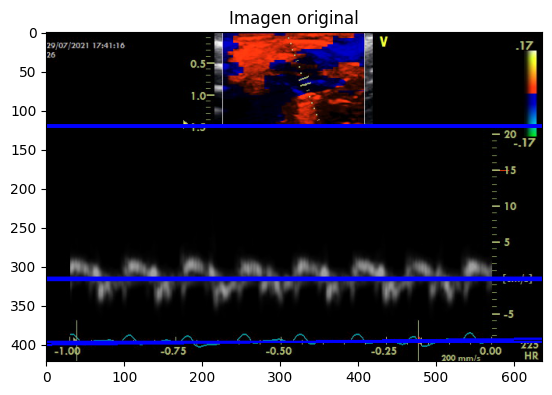

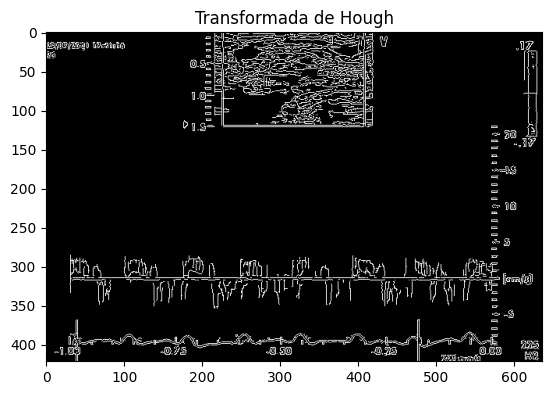

Imagenes DICOM/LAQIOD82


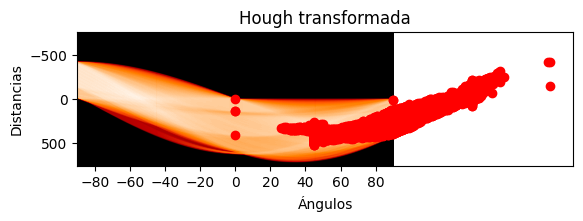

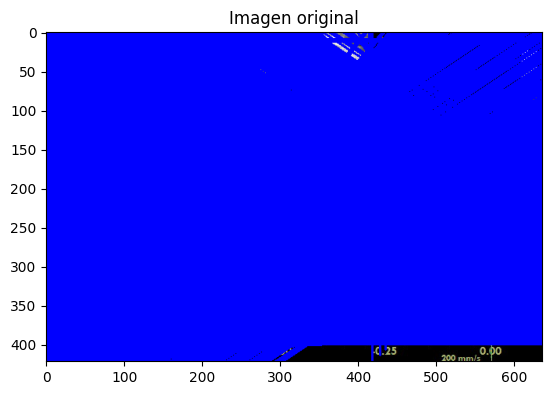

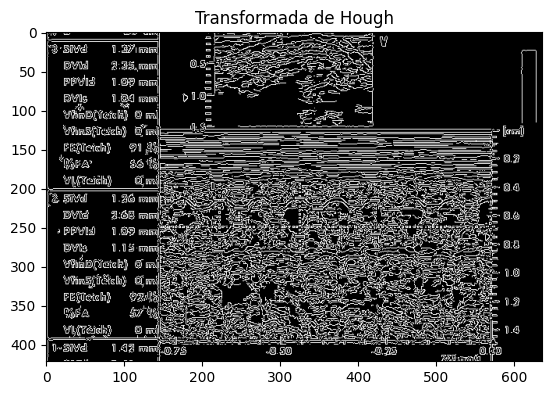

Imagenes DICOM/LAQJ4RO2


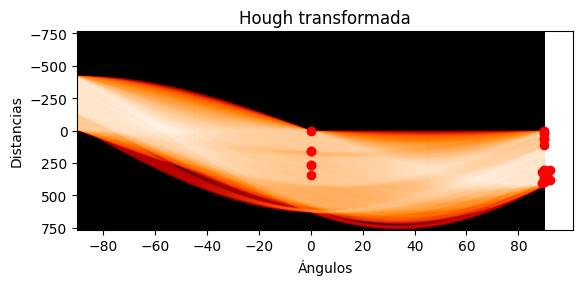

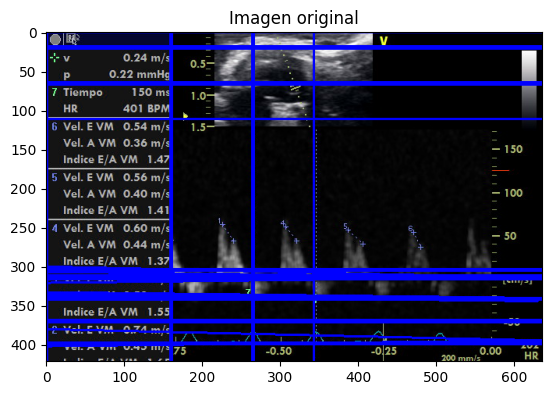

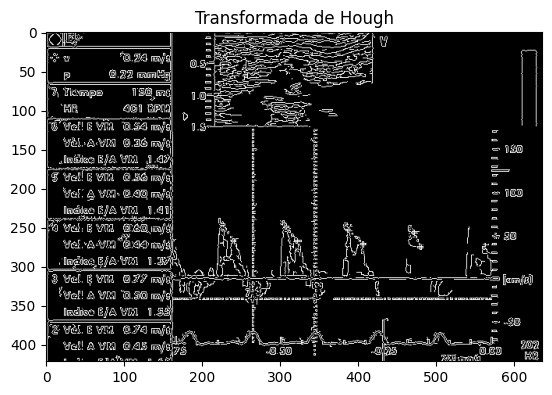

Imagenes DICOM/LAQJMHO2


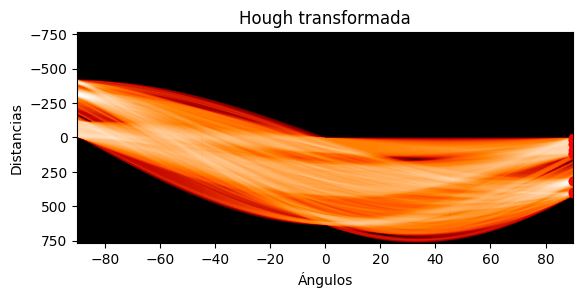

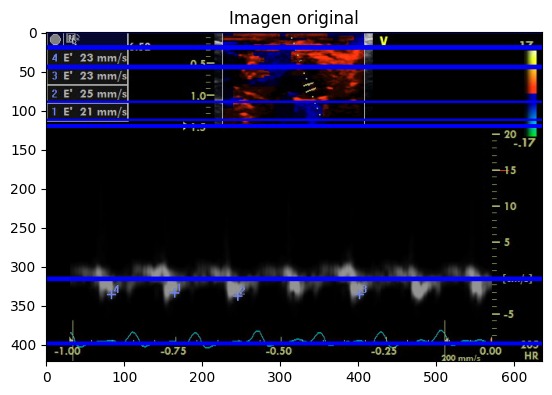

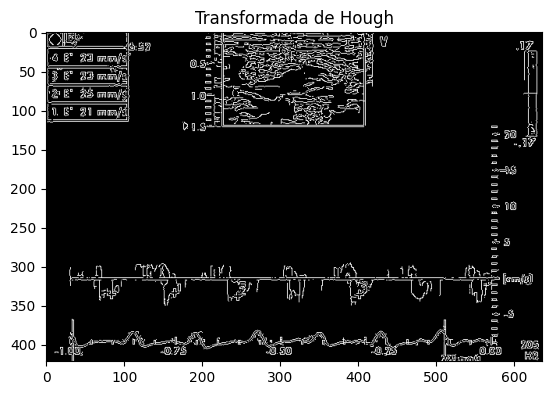

Imagenes DICOM/LAQJK802


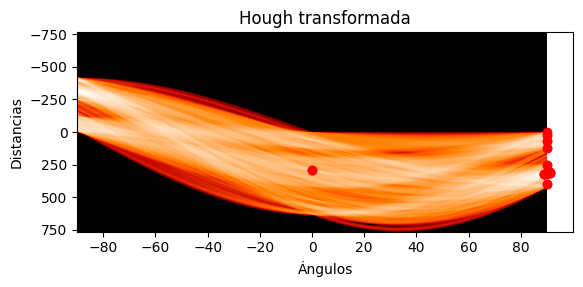

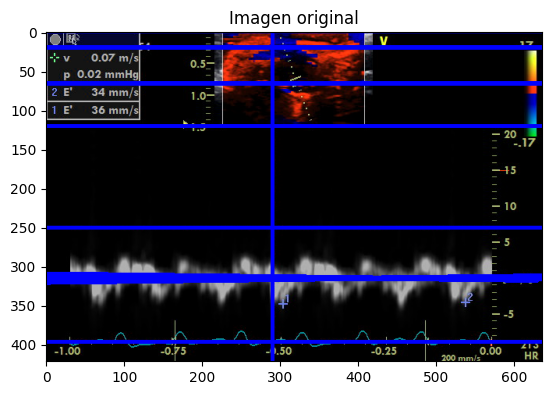

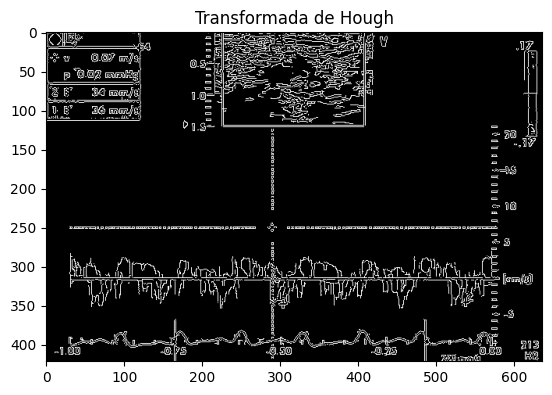

Imagenes DICOM/LAQJ0O82


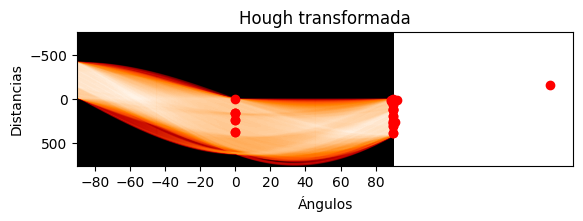

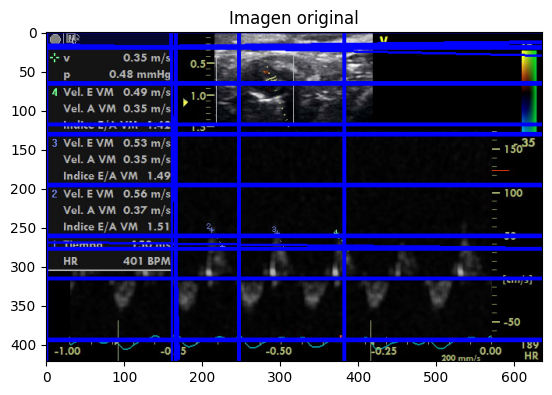

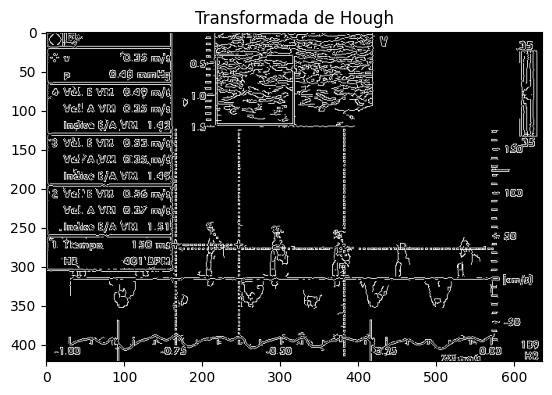

Imagenes DICOM/LAQJ1Q82


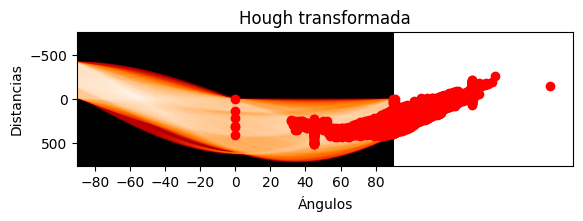

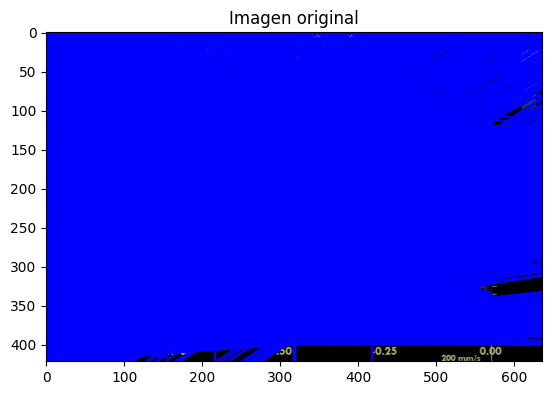

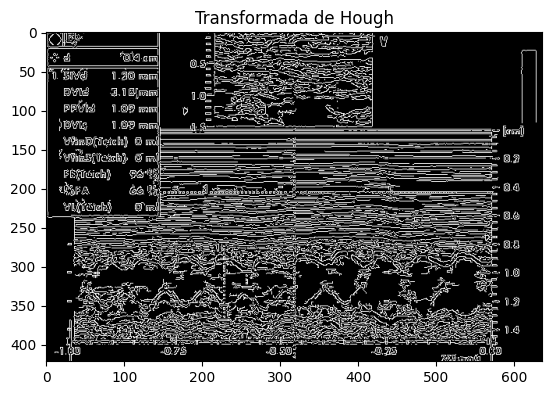

Imagenes DICOM/LAQJBLO2


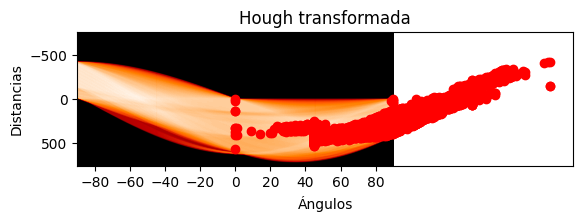

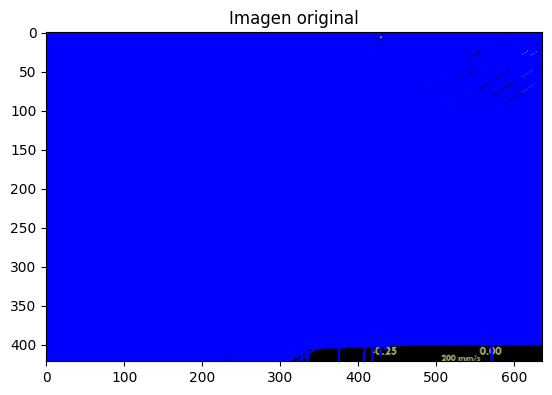

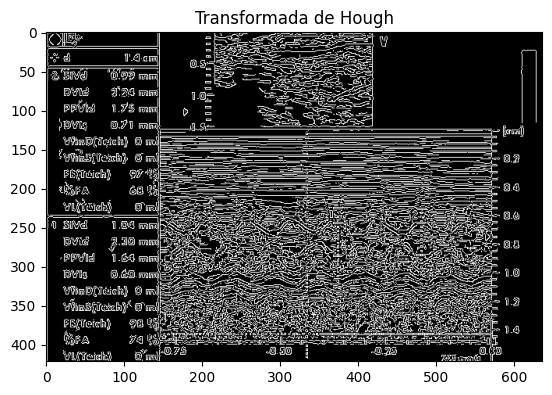

Imagenes DICOM/LAQJLEO2


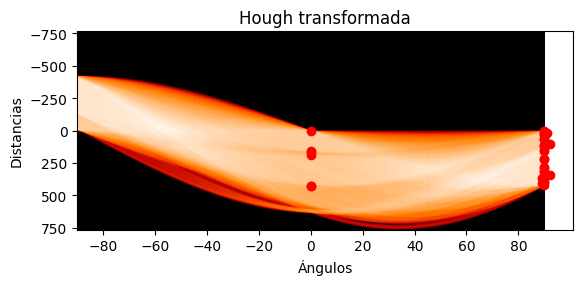

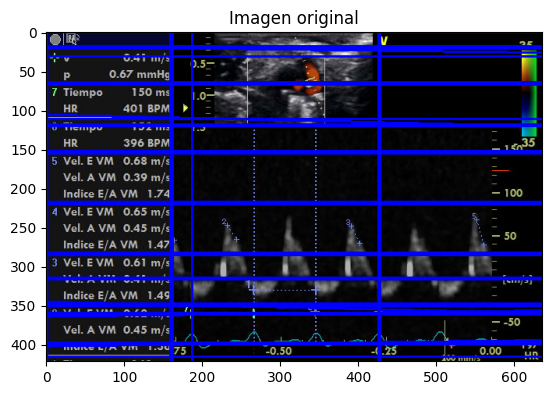

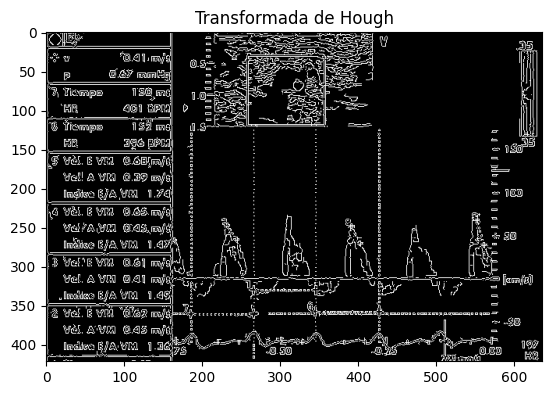

Imagenes DICOM/LAQIPAG2


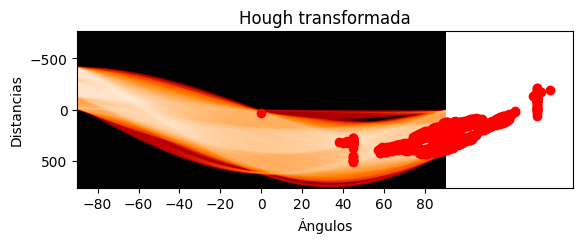

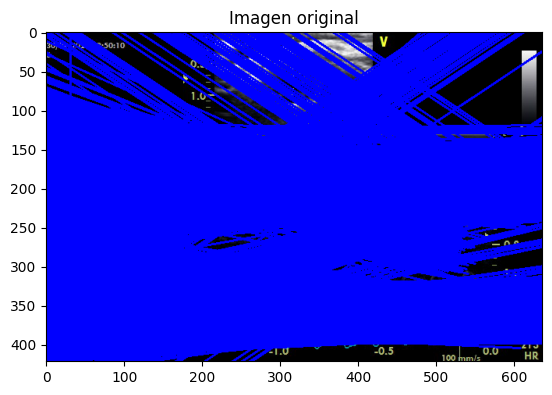

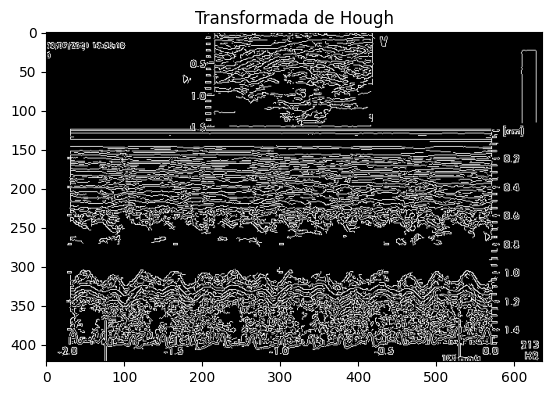

Imagenes DICOM/LAQJQNO2


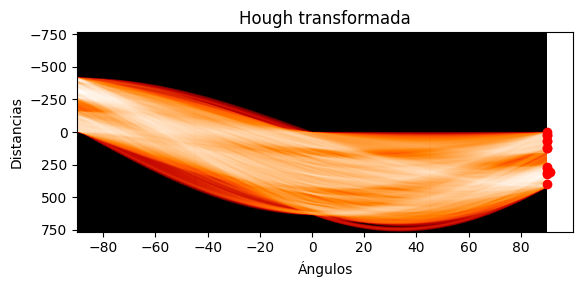

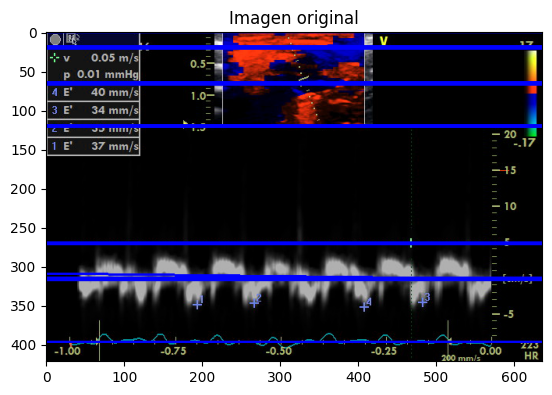

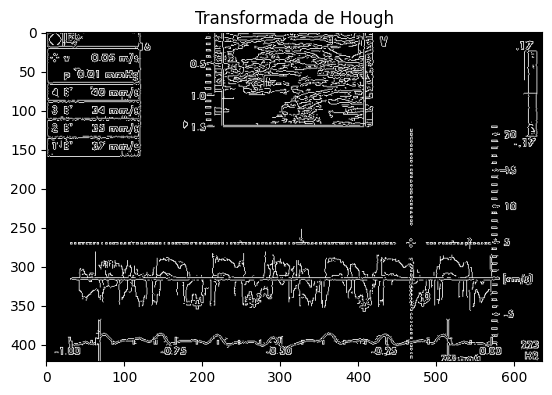

Imagenes DICOM/LAQK45G2


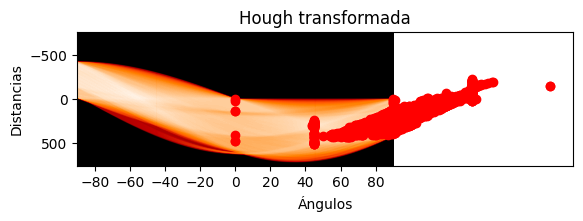

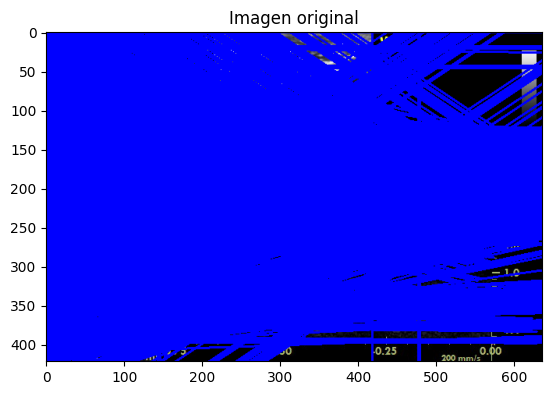

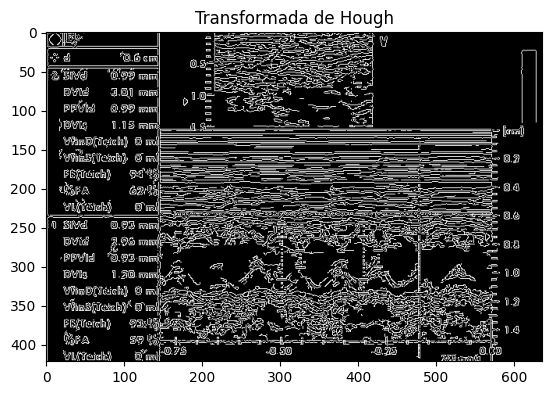

Imagenes DICOM/LAQJ2Q82


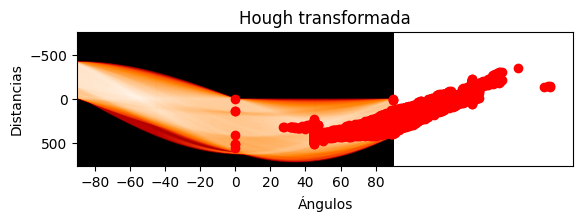

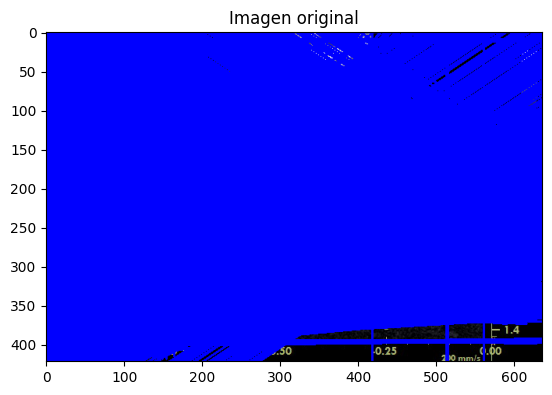

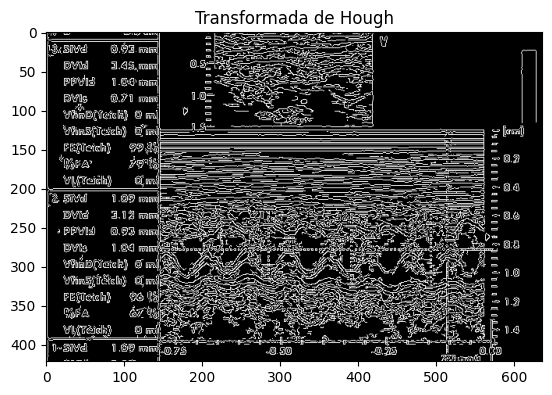

In [8]:


# Ruta a la carpeta de imágenes DICOM
carpeta_imagenes = 'Imagenes DICOM'

# Obtener la lista de archivos en la carpeta de imágenes DICOM
archivos = os.listdir(carpeta_imagenes)

# Procesar cada imagen DICOM
for archivo in archivos:
    # Ruta completa al archivo DICOM
    ruta = os.path.join(carpeta_imagenes, archivo)

    if ruta not in imagens_sample:
      print(ruta)
      # Leer el archivo DICOM
      dcm = pydicom.dcmread(ruta)

      # Obtener la matriz de píxeles de la imagen
      imagen = dcm.pixel_array
      imagen = cv2.cvtColor(imagen, cv2.COLOR_YCrCb2BGR)

      # Dimensión imagen

      alto, ancho, _ = np.shape(imagen)

      # Aplicar detección de bordes
      bordes = cv2.Canny(imagen, 50, 150)

      # Aplicar transformada de Hough para los peaks
      lineas = cv2.HoughLines(bordes, 1, np.pi / 180, threshold=150)

      # Todas las lineas de hough
      gray_image = imagen.copy()
      gray_image = cv2.cvtColor(gray_image, cv2.COLOR_BGR2GRAY)
      tested_angles = np.linspace(-np.pi / 2, np.pi / 2, 360, endpoint=False)
      h, theta, d = hough_line(gray_image, theta=tested_angles)

      # Mostrar líneas extraídas sobre la imagen original
      imagen_con_lineas = imagen.copy()

      # Generating figure 1.
      plt.imshow(np.log(1 + h), extent=[-90,90,d[-1], d[0]], cmap='gist_heat', aspect = 0.05)
      x_ticks = np.arange(-80, 90, 20)
      plt.xticks(x_ticks)
      plt.title('Hough transformada')
      plt.xlabel('Ángulos')
      plt.ylabel('Distancias')

      horizontales = []
      verticales = []

      if lineas is not None:
          for linea in lineas:
              rho, theta = linea[0]
              plt.plot(np.round(theta/np.pi*180,0), rho, 'ro')
              a = np.cos(theta)
              b = np.sin(theta)
              x0 = a * rho
              y0 = b * rho
              x1 = int(x0 + ancho * (-b))
              y1 = int(y0 + alto * (a))
              x2 = int(x0 - ancho * (-b))
              y2 = int(y0 - alto * (a))
              cv2.line(imagen_con_lineas, (x1, y1), (x2, y2), (0, 0, 255), 2)

              if np.round(x1-x2,-1) == 0 and x1 > 10:
                if round(x1,-1) not in horizontales:
                  horizontales.append(x1)
              if np.round(y1-y2,-1) == 0 and y1 > 10:
                if round(y1,-1) not in verticales:
                  verticales.append(y1)

      save_cut(archivo,imagen, horizontales, verticales,'/content/recortes/')
      new_name = f"Hough_{archivo}"
      save_cut(new_name,bordes, horizontales, verticales,'/content/hough_recortes/')
      plt.show()
      # Mostrar imagen original y líneas extraídas
      plt.figure()
      plt.imshow(imagen_con_lineas, cmap='gray')
      plt.title('Imagen original')
      plt.show()

      # Mostrar transformada de Hough en el plano (𝜃, 𝜌)
      plt.figure()
      plt.imshow(bordes, cmap='gray')
      plt.title('Transformada de Hough')
      plt.show()

In [9]:
!pip install easyocr

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 76.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 813.9/813.9 kB 55.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 146.0/146.0 kB 17.3 MB/s eta 0:00:00


In [10]:
%cd ..

/content


In [11]:
import easyocr

reader = easyocr.Reader(['en']) # this needs to run only once to load the model into memory

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

recortes/LAQIS1G21613140197.png
[161, 21] [161, 41]
Número: 0.63
Posición: ([97, 3], [161, 21])
---
[161, 41] [121, 63]
Número: 0.53
Posición: ([19, 23], [161, 41])
---
[161, 61] [-1, -1]
Número: 1.19
Posición: ([129, 45], [161, 61])
---


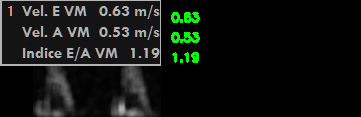

recortes/LAQINRO21431242346.png
[120, 19] [35, 41]
Número: 1.15
Posición: ([59, 5], [120, 19])
---
[120, 41] [43, 61]
Número: 2.46
Posición: ([59, 25], [120, 41])
---
[120, 61] [33, 78]
Número: 1.37
Posición: ([59, 45], [120, 61])
---
[120, 78] [-1, -1]
Número: Missing
Posición: ([59, 67], [120, 78])
---


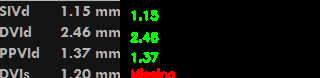

recortes/LAQJJAG225112916167.png
[53, 25] [-1, -1]
Número: 1.03
Posición: ([23, 9], [53, 25])
---


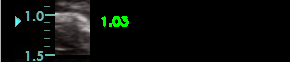

recortes/LAQIOOG221612014621.png
[70, 29] [-1, -1]
Número: Missing
Posición: ([37, 15], [70, 29])
---


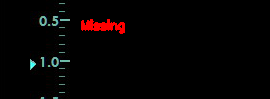

recortes/LAQISAO21053140121.png
[105, 13] [51, 37]
Número: Missing
Posición: ([39, 0], [105, 13])
---
[105, 37] [105, 61]
Número: 30.74
Posición: ([63, 21], [105, 37])
---
[105, 61] [53, 83]
Número: Missing
Posición: ([3, 41], [105, 61])
---
[105, 83] [99, 105]
Número: 32.36
Posición: ([63, 67], [105, 83])
---
[99, 105] [-1, -1]
Número: Missing
Posición: ([41, 91], [99, 105])
---


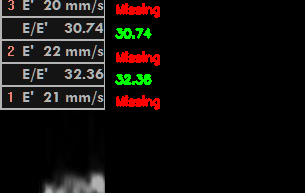

recortes/LAQJFG8241812414612.png
[71, 39] [73, 79]
Número: Missing
Posición: ([37, 23], [71, 39])
---
[73, 79] [-1, -1]
Número: 1.03
Posición: ([39, 65], [73, 79])
---


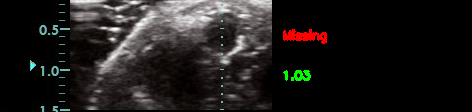

recortes/LAQJ8B021592580196.png
[159, 21] [159, 41]
Número: 0.62
Posición: ([97, 3], [159, 21])
---
[159, 41] [121, 62]
Número: 0.46
Posición: ([19, 23], [159, 41])
---
[159, 61] [-1, -1]
Número: 1.33
Posición: ([129, 45], [159, 61])
---


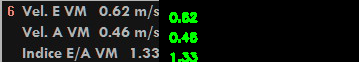

recortes/LAQJKSG21612980194.png
[161, 23] [161, 45]
Número: 0.70
Posición: ([97, 7], [161, 23])
---
[161, 45] [121, 65]
Número: 0.42
Posición: ([21, 27], [161, 45])
---
[161, 65] [-1, -1]
Número: 1.67
Posición: ([129, 49], [161, 65])
---


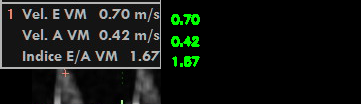

recortes/LAQJLEO21593970361.png
[159, 31] [-1, -1]
Número: 0.45
Posición: ([21, 11], [159, 31])
---


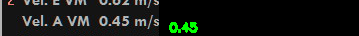

recortes/LAQJLEO21592170155.png
[159, 21] [159, 41]
Número: 0.68
Posición: ([97, 5], [159, 21])
---
[159, 41] [121, 62]
Número: 0.39
Posición: ([19, 23], [159, 41])
---
[159, 61] [-1, -1]
Número: Missing
Posición: ([129, 45], [159, 61])
---


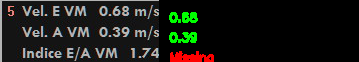

recortes/LAQJ42G21591940132.png
[159, 21] [159, 41]
Número: 0.60
Posición: ([97, 3], [159, 21])
---
[159, 41] [121, 62]
Número: 0.45
Posición: ([19, 23], [159, 41])
---
[159, 61] [-1, -1]
Número: 1.32
Posición: ([129, 45], [159, 61])
---


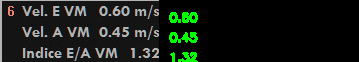

recortes/LAQJ0O821612590197.png
[161, 21] [161, 41]
Número: 0.56
Posición: ([97, 3], [161, 21])
---
[161, 41] [121, 62]
Número: 0.37
Posición: ([19, 23], [161, 41])
---
[161, 61] [-1, -1]
Número: 1.51
Posición: ([127, 43], [161, 61])
---


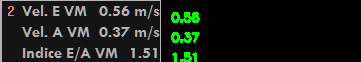

recortes/LAQIOD8241812414612.png
[63, 39] [71, 79]
Número: 0.53
Posición: ([39, 23], [63, 39])
---
[71, 79] [-1, -1]
Número: Missing
Posición: ([49, 65], [71, 79])
---


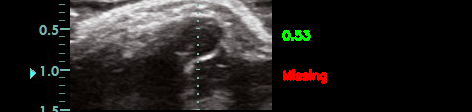

recortes/LAQJJAG2159129067.png
[159, 21] [159, 41]
Número: 0.81
Posición: ([97, 5], [159, 21])
---
[159, 41] [121, 62]
Número: 0.66
Posición: ([19, 23], [159, 41])
---
[159, 62] [-1, -1]
Número: 1.22
Posición: ([129, 45], [159, 62])
---


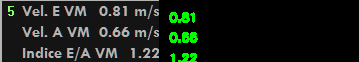

recortes/LAQJHQO21431242346.png
[120, 19] [35, 41]
Número: 1.04
Posición: ([59, 5], [120, 19])
---
[120, 41] [43, 61]
Número: 3.12
Posición: ([59, 25], [120, 41])
---
[120, 61] [33, 78]
Número: 1.15
Posición: ([57, 43], [120, 61])
---
[120, 78] [-1, -1]
Número: Missing
Posición: ([59, 67], [120, 78])
---


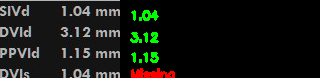

recortes/LAQJK802289119067.png
[115, 19] [215, 25]
Número: Missing
Posición: ([57, 5], [115, 19])
---
[215, 25] [37, 43]
Número: 1.03
Posición: ([185, 9], [215, 25])
---
[115, 43] [38.345345587992625, 18.47988014679189]
Número: Missing
Posición: ([55, 25], [115, 43])
---
[38.345345587992625, 18.47988014679189] [-1, -1]
Número: Missing
Posición: ([2.654654412007375, 4.520119853208112], [38.345345587992625, 18.47988014679189])
---


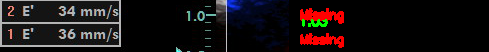

recortes/LAQJ1I82418124360.png
[69, 25] [-1, -1]
Número: 12.09
Posición: ([0, 13], [69, 25])
---


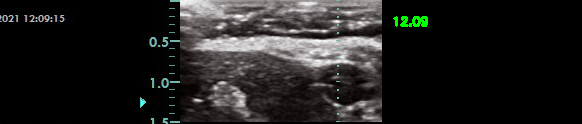

recortes/LAQJ998228043021.png
[135, 21] [-1, -1]
Número: Missing
Posición: ([71, 7], [135, 21])
---


recortes/LAQJ7QO215964021.png
[159, 23] [159, 43]
Número: 0.51
Posición: ([97, 7], [159, 23])
---
[159, 43] [-1, -1]
Número: 1.04
Posición: ([81, 27], [159, 43])
---


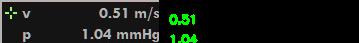

recortes/LAQIS1G2161120067.png
[161, 21] [161, 41]
Número: 0.68
Posición: ([97, 5], [161, 21])
---
[161, 41] [-1, -1]
Número: 0.59
Posición: ([19, 23], [161, 41])
---


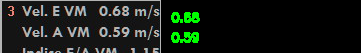

recortes/LAQJNQ821593110262.png
[159, 21] [159, 41]
Número: 0.86
Posición: ([97, 3], [159, 21])
---
[159, 41] [-1, -1]
Número: 0.62
Posición: ([19, 23], [159, 41])
---


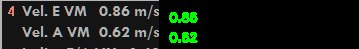

recortes/LAQIOOG21441202321.png
[121, 21] [35, 43]
Número: 1.33
Posición: ([59, 7], [121, 21])
---
[121, 43] [43, 65]
Número: 2.35
Posición: ([57, 25], [121, 43])
---
[121, 65] [33, 85]
Número: 1.26
Posición: ([57, 45], [121, 65])
---
[121, 85] [84, 99]
Número: 1.15
Posición: ([59, 69], [121, 85])
---
[121, 99] [-1, -1]
Número: Missing
Posición: ([89, 89], [121, 99])
---


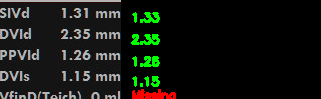

recortes/LAQJPMG2225119092.png
[135, 21] [-1, -1]
Número: Missing
Posición: ([81, 3], [135, 21])
---


recortes/LAQJFG82143124012.png
[143, 19] [59, 41]
Número: 0.99
Posición: ([81, 3], [143, 19])
---
[143, 41] [67, 61]
Número: 2.79
Posición: ([81, 25], [143, 41])
---
[143, 63] [57, 83]
Número: 1.26
Posición: ([83, 45], [143, 63])
---
[143, 83] [143, 105]
Número: 1.15
Posición: ([83, 67], [143, 83])
---
[143, 105] [-1, -1]
Número: Missing
Posición: ([19, 85], [143, 105])
---


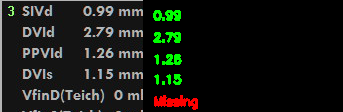

recortes/LAQJ0O821611940132.png
[161, 21] [161, 41]
Número: 0.53
Posición: ([7, 1], [161, 21])
---
[161, 41] [121, 62]
Número: 0.35
Posición: ([19, 23], [161, 41])
---
[161, 61] [-1, -1]
Número: 1.49
Posición: ([129, 45], [161, 61])
---


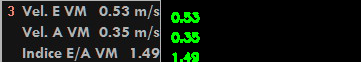

recortes/LAQJKSG2161120067.png
[161, 21] [161, 41]
Número: 0.67
Posición: ([97, 5], [161, 21])
---
[161, 41] [-1, -1]
Número: 0.45
Posición: ([19, 23], [161, 41])
---


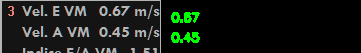

recortes/LAQJ9982280113069.png
[209, 23] [45, 41]
Número: Missing
Posición: ([185, 7], [209, 23])
---
[135, 41] [-1, -1]
Número: Missing
Posición: ([69, 23], [135, 41])
---


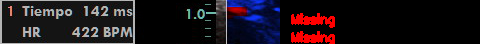

recortes/LAQJ8B021593910326.png
[159, 21] [159, 41]
Número: 0.58
Posición: ([97, 3], [159, 21])
---
[159, 41] [121, 63]
Número: 0.52
Posición: ([19, 23], [159, 41])
---
[159, 61] [-1, -1]
Número: 1.12
Posición: ([129, 45], [159, 61])
---


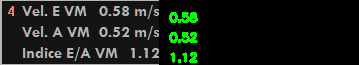

recortes/LAQIS1G21611940132.png
[161, 21] [161, 41]
Número: 0.70
Posición: ([97, 3], [161, 21])
---
[161, 41] [121, 62]
Número: 0.58
Posición: ([19, 23], [161, 41])
---
[161, 61] [-1, -1]
Número: 1.20
Posición: ([129, 45], [161, 61])
---


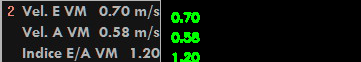

recortes/LAQJ29822161241460.png
[70, 51] [70, 91]
Número: 0.53
Posición: ([39, 35], [70, 51])
---
[70, 91] [-1, -1]
Número: Missing
Posición: ([49, 77], [70, 91])
---


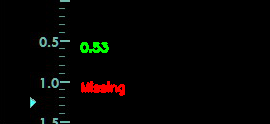

recortes/LAQJ42G21592590197.png
[159, 21] [159, 41]
Número: 0.57
Posición: ([97, 3], [159, 21])
---
[159, 41] [121, 62]
Número: 0.38
Posición: ([19, 23], [159, 41])
---
[159, 61] [-1, -1]
Número: 1.50
Posición: ([129, 45], [159, 61])
---


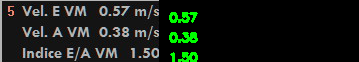

recortes/LAQIS1G23076416121.png
[53, 29] [-1, -1]
Número: Missing
Posición: ([23, 15], [53, 29])
---


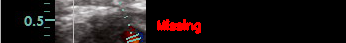

recortes/LAQJ8B02159120065.png
[159, 21] [159, 43]
Número: 0.64
Posición: ([97, 5], [159, 21])
---
[159, 43] [60, 55]
Número: 0.45
Posición: ([19, 23], [159, 43])
---
[116, 54] [-1, -1]
Número: Missing
Posición: ([94, 48], [116, 54])
---


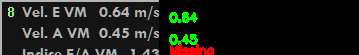

recortes/LAQJ4RO215964021.png
[159, 23] [159, 43]
Número: 0.24
Posición: ([97, 7], [159, 23])
---
[159, 43] [-1, -1]
Número: 0.22
Posición: ([77, 25], [159, 43])
---


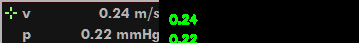

recortes/LAQJ42G21593970316.png
[159, 31] [159, 53]
Número: 0.63
Posición: ([97, 15], [159, 31])
---
[159, 53] [121, 73]
Número: 0.41
Posición: ([19, 33], [159, 53])
---
[159, 73] [-1, -1]
Número: 1.53
Posición: ([129, 57], [159, 73])
---


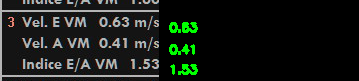

recortes/LAQJLEO24266418731.png
[21, 19] [-1, -1]
Número: Missing
Posición: ([0, 5], [21, 19])
---


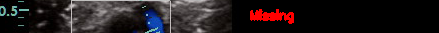

recortes/LAQJKSG21611940132.png
[161, 21] [161, 41]
Número: 0.58
Posición: ([97, 3], [161, 21])
---
[161, 41] [121, 62]
Número: 0.39
Posición: ([19, 23], [161, 41])
---
[161, 61] [-1, -1]
Número: Missing
Posición: ([141, 45], [161, 61])
---


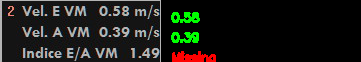

recortes/LAQIS1G230712016167.png
[55, 25] [-1, -1]
Número: 1.03
Posición: ([25, 9], [55, 25])
---


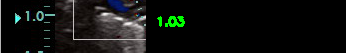

recortes/LAQJP7G21612590215.png
[161, 23] [65, 43]
Número: 0.60
Posición: ([21, 7], [161, 23])
---
[161, 43] [-1, -1]
Número: 1.38
Posición: ([129, 27], [161, 43])
---


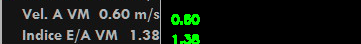

recortes/LAQK45G214333523270.png
[120, 29] [33, 49]
Número: 0.93
Posición: ([59, 13], [120, 29])
---
[120, 51] [85, 65]
Número: 1.20
Posición: ([59, 33], [120, 51])
---
[120, 65] [-1, -1]
Número: Missing
Posición: ([89, 55], [120, 65])
---


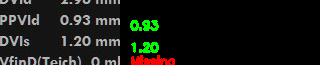

recortes/LAQJ7QO2159120067.png
[159, 21] [159, 41]
Número: 0.58
Posición: ([97, 3], [159, 21])
---
[159, 41] [-1, -1]
Número: 0.49
Posición: ([19, 23], [159, 41])
---


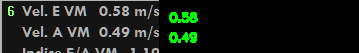

recortes/LAQJTLO2418124310.png
[73, 25] [175, 49]
Número: 10.39
Posición: ([0, 13], [73, 25])
---
[175, 49] [-1, -1]
Número: Missing
Posición: ([153, 35], [175, 49])
---


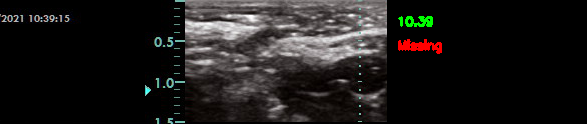

recortes/LAQJ6DO245664021.png
[121, 23] [207, 29]
Número: 0.01
Posición: ([57, 7], [121, 23])
---
[207, 29] [121, 43]
Número: 0.53
Posición: ([185, 15], [207, 29])
---
[121, 43] [-1, -1]
Número: 0.00
Posición: ([21, 27], [121, 43])
---


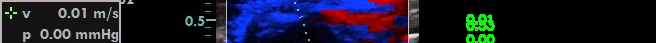

recortes/LAQJJO02363119067.png
[115, 19] [215, 25]
Número: Missing
Posición: ([57, 5], [115, 19])
---
[215, 25] [37, 43]
Número: 1.03
Posición: ([185, 9], [215, 25])
---
[115, 43] [-1, -1]
Número: Missing
Posición: ([55, 25], [115, 43])
---


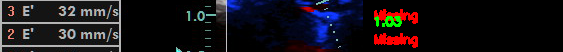

recortes/LAQJLEO215964031.png
[159, 11] [159, 33]
Número: Missing
Posición: ([97, 0], [159, 11])
---
[159, 33] [-1, -1]
Número: 0.67
Posición: ([79, 17], [159, 33])
---


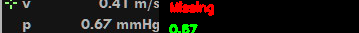

recortes/LAQJLEO21591520120.png
[159, 11] [43, 31]
Número: Missing
Posición: ([109, 0], [159, 11])
---
[159, 31] [-1, -1]
Número: Missing
Posición: ([97, 15], [159, 31])
---


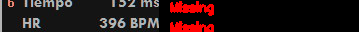

recortes/LAQJ3N021592800215.png
[159, 23] [159, 45]
Número: 0.54
Posición: ([97, 7], [159, 23])
---
[159, 45] [121, 65]
Número: 0.43
Posición: ([21, 25], [159, 45])
---
[159, 65] [-1, -1]
Número: 1.26
Posición: ([127, 47], [159, 65])
---


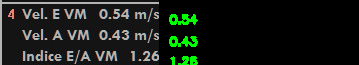

recortes/LAQJNQ821591940132.png
[159, 21] [159, 41]
Número: Missing
Posición: ([97, 3], [159, 21])
---
[159, 41] [121, 62]
Número: 0.45
Posición: ([19, 23], [159, 41])
---
[159, 62] [-1, -1]
Número: Missing
Posición: ([129, 45], [159, 62])
---


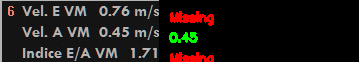

recortes/LAQJLEO21593500316.png
[159, 31] [-1, -1]
Número: 1.49
Posición: ([129, 15], [159, 31])
---


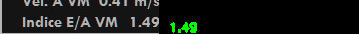

recortes/LAQJP7G216164021.png
[161, 23] [161, 43]
Número: 0.92
Posición: ([97, 7], [161, 23])
---
[161, 43] [-1, -1]
Número: 3.37
Posición: ([79, 27], [161, 43])
---


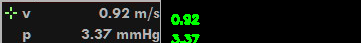

recortes/LAQJJO0236364021.png
[121, 23] [215, 29]
Número: 0.09
Posición: ([57, 7], [121, 23])
---
[215, 29] [121, 43]
Número: Missing
Posición: ([185, 15], [215, 29])
---
[121, 43] [-1, -1]
Número: 0.03
Posición: ([21, 27], [121, 43])
---


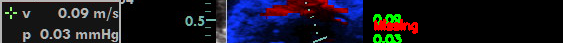

recortes/LAQJ6DO2456119087.png
[109, 23] [-1, -1]
Número: Missing
Posición: ([57, 7], [109, 23])
---


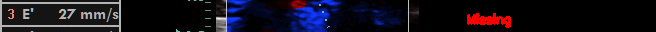

recortes/LAQJNQ821593950327.png
[159, 21] [159, 41]
Número: Missing
Posición: ([97, 3], [159, 21])
---
[159, 41] [121, 63]
Número: 0.55
Posición: ([19, 23], [159, 41])
---
[159, 63] [-1, -1]
Número: 1.30
Posición: ([129, 45], [159, 63])
---


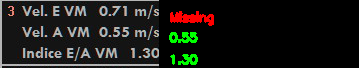

recortes/LAQJ0O8216164021.png
[161, 23] [161, 43]
Número: 0.35
Posición: ([97, 7], [161, 23])
---
[161, 43] [-1, -1]
Número: 0.48
Posición: ([79, 27], [161, 43])
---


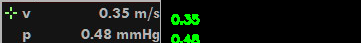

recortes/LAQK45G21431242346.png
[120, 19] [35, 41]
Número: 0.99
Posición: ([59, 3], [120, 19])
---
[120, 41] [43, 61]
Número: 3.01
Posición: ([59, 25], [120, 41])
---
[120, 61] [33, 78]
Número: 0.99
Posición: ([59, 45], [120, 61])
---
[120, 78] [-1, -1]
Número: Missing
Posición: ([59, 67], [120, 78])
---


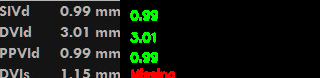

recortes/LAQJ6DO24563010121.png
[109, 11] [113, 35]
Número: Missing
Posición: ([79, 0], [109, 11])
---
[113, 35] [-1, -1]
Número: Missing
Posición: ([57, 19], [113, 35])
---


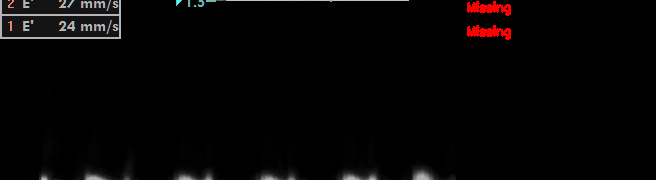

recortes/LAQJP7G2161121067.png
[161, 21] [161, 41]
Número: Missing
Posición: ([97, 3], [161, 21])
---
[161, 41] [88, 54]
Número: 0.48
Posición: ([19, 23], [161, 41])
---
[121, 54] [-1, -1]
Número: Missing
Posición: ([93, 45], [121, 54])
---


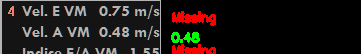

recortes/LAQIS1G216164021.png
[161, 21] [43, 43]
Número: Missing
Posición: ([109, 7], [161, 21])
---
[161, 43] [-1, -1]
Número: Missing
Posición: ([97, 25], [161, 43])
---


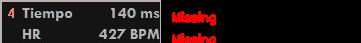

recortes/LAQK5S0228612414621.png
[61, 29] [-1, -1]
Número: Missing
Posición: ([37, 15], [61, 29])
---


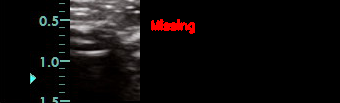

recortes/LAQJJAG21593140262.png
[159, 21] [159, 41]
Número: Missing
Posición: ([21, 1], [159, 21])
---
[159, 41] [-1, -1]
Número: 0.58
Posición: ([21, 25], [159, 41])
---


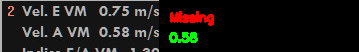

recortes/LAQJPMG22253110121.png
[137, 11] [-1, -1]
Número: Missing
Posición: ([71, 0], [137, 11])
---


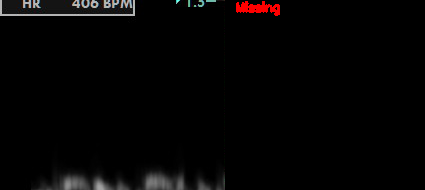

recortes/LAQJ42G21593140269.png
[159, 13] [159, 35]
Número: 0.65
Posición: ([97, 0], [159, 13])
---
[159, 35] [-1, -1]
Número: 0.41
Posición: ([21, 17], [159, 35])
---


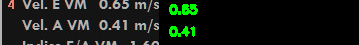

recortes/LAQJKSG216164031.png
[161, 13] [161, 33]
Número: 0.10
Posición: ([97, 0], [161, 13])
---
[161, 33] [-1, -1]
Número: 0.08
Posición: ([79, 17], [161, 33])
---


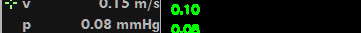

recortes/LAQJJAG21591940132.png
[159, 21] [159, 41]
Número: Missing
Posición: ([21, 1], [159, 21])
---
[159, 41] [121, 62]
Número: 0.61
Posición: ([19, 23], [159, 41])
---
[159, 61] [-1, -1]
Número: 1.24
Posición: ([129, 45], [159, 61])
---


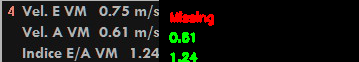

recortes/LAQJJAG21593680327.png
[159, 19] [43, 41]
Número: Missing
Posición: ([109, 5], [159, 19])
---
[159, 41] [-1, -1]
Número: Missing
Posición: ([95, 23], [159, 41])
---


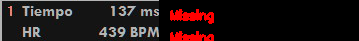

recortes/LAQK5P821431245121.png
[92, 21] [92, 43]
Número: Missing
Posición: ([31, 7], [92, 21])
---
[92, 43] [92, 63]
Número: 3.94
Posición: ([29, 25], [92, 43])
---
[92, 63] [92, 85]
Número: 0.88
Posición: ([31, 47], [92, 63])
---
[92, 85] [92, 103]
Número: Missing
Posición: ([0, 69], [92, 85])
---
[92, 103] [-1, -1]
Número: Missing
Posición: ([39, 91], [92, 103])
---


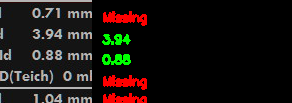

recortes/LAQJ7QO21593920316.png
[159, 31] [159, 53]
Número: Missing
Posición: ([97, 15], [159, 31])
---
[159, 53] [121, 73]
Número: 0.50
Posición: ([21, 35], [159, 53])
---
[159, 73] [-1, -1]
Número: 1.44
Posición: ([129, 57], [159, 73])
---


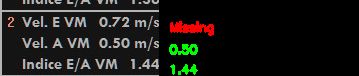

recortes/LAQJ3N021593980348.png
[159, 21] [159, 41]
Número: 0.68
Posición: ([97, 3], [159, 21])
---
[159, 41] [-1, -1]
Número: 0.49
Posición: ([19, 23], [159, 41])
---


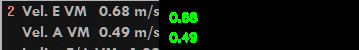

recortes/LAQJ2982143124230.png
[120, 29] [43, 51]
Número: 3.01
Posición: ([59, 13], [120, 29])
---
[120, 51] [33, 71]
Número: 0.99
Posición: ([57, 33], [120, 51])
---
[120, 71] [84, 92]
Número: 1.15
Posición: ([59, 55], [120, 71])
---
[120, 93] [83, 115]
Número: Missing
Posición: ([91, 77], [120, 93])
---
[120, 113] [-1, -1]
Número: Missing
Posición: ([91, 97], [120, 113])
---


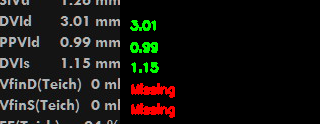

recortes/LAQJ7QO21591940132.png
[159, 21] [159, 41]
Número: 0.57
Posición: ([97, 3], [159, 21])
---
[159, 41] [121, 62]
Número: 0.50
Posición: ([19, 23], [159, 41])
---
[159, 61] [-1, -1]
Número: 1.15
Posición: ([129, 45], [159, 61])
---


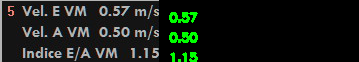

recortes/LAQJ42G2159116067.png
[159, 21] [159, 41]
Número: 0.65
Posición: ([97, 5], [159, 21])
---
[159, 41] [-1, -1]
Número: 0.44
Posición: ([19, 23], [159, 41])
---


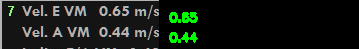

recortes/LAQJ7QO21592590197.png
[159, 21] [159, 41]
Número: Missing
Posición: ([97, 3], [159, 21])
---
[159, 41] [121, 62]
Número: 0.52
Posición: ([19, 23], [159, 41])
---
[159, 61] [-1, -1]
Número: 1.37
Posición: ([129, 45], [159, 61])
---


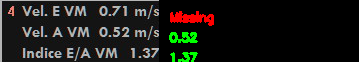

recortes/LAQJ6DO245687067.png
[115, 20] [-1, -1]
Número: Missing
Posición: ([57, 5], [115, 20])
---


recortes/LAQJNQ82159121067.png
[159, 21] [159, 41]
Número: 0.81
Posición: ([97, 5], [159, 21])
---
[159, 41] [121, 54]
Número: 0.54
Posición: ([19, 23], [159, 41])
---
[121, 54] [-1, -1]
Número: Missing
Posición: ([65, 45], [121, 54])
---


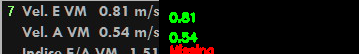

recortes/LAQJ2Q82143125012.png
[143, 19] [59, 41]
Número: 0.93
Posición: ([81, 3], [143, 19])
---
[143, 41] [67, 61]
Número: 3.45
Posición: ([81, 25], [143, 41])
---
[143, 61] [57, 83]
Número: 1.04
Posición: ([83, 45], [143, 61])
---
[143, 83] [143, 105]
Número: Missing
Posición: ([81, 67], [143, 83])
---
[143, 105] [-1, -1]
Número: Missing
Posición: ([19, 85], [143, 105])
---


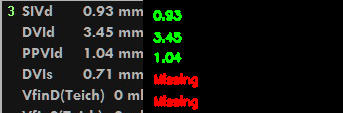

recortes/LAQISAO2105119046.png
[105, 19] [105, 43]
Número: Missing
Posición: ([41, 5], [105, 19])
---
[105, 43] [47, 67]
Número: Missing
Posición: ([7, 25], [105, 43])
---
[105, 65] [-1, -1]
Número: 34.16
Posición: ([63, 51], [105, 65])
---


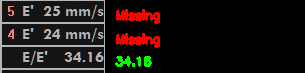

recortes/LAQIOD82144124012.png
[144, 19] [59, 41]
Número: 1.37
Posición: ([83, 5], [144, 19])
---
[144, 41] [67, 61]
Número: 2.35
Posición: ([81, 25], [144, 41])
---
[144, 61] [57, 83]
Número: 1.09
Posición: ([83, 45], [144, 61])
---
[144, 83] [144, 105]
Número: 1.04
Posición: ([83, 67], [144, 83])
---
[144, 105] [-1, -1]
Número: Missing
Posición: ([19, 85], [144, 105])
---


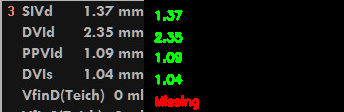

recortes/LAQJ1Q82145124046.png
[145, 21] [59, 41]
Número: 1.20
Posición: ([83, 5], [145, 21])
---
[145, 41] [67, 61]
Número: 3.18
Posición: ([81, 25], [145, 41])
---
[145, 61] [57, 78]
Número: 1.09
Posición: ([83, 45], [145, 61])
---
[145, 78] [-1, -1]
Número: Missing
Posición: ([95, 67], [145, 78])
---


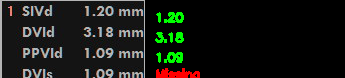

recortes/LAQJBLO21441242346.png
[121, 19] [35, 41]
Número: 0.99
Posición: ([59, 3], [121, 19])
---
[121, 41] [43, 61]
Número: 2.24
Posición: ([59, 25], [121, 41])
---
[121, 61] [33, 78]
Número: Missing
Posición: ([57, 43], [121, 61])
---
[121, 78] [-1, -1]
Número: Missing
Posición: ([59, 67], [121, 78])
---


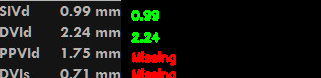

recortes/LAQJJAG215964021.png
[159, 23] [159, 43]
Número: 0.67
Posición: ([97, 7], [159, 23])
---
[159, 43] [-1, -1]
Número: 1.81
Posición: ([81, 27], [159, 43])
---


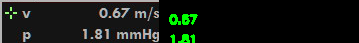

recortes/LAQJ8B021591930131.png
[159, 21] [159, 41]
Número: 0.64
Posición: ([97, 5], [159, 21])
---
[159, 41] [121, 62]
Número: 0.45
Posición: ([19, 23], [159, 41])
---
[159, 61] [-1, -1]
Número: 1.44
Posición: ([129, 45], [159, 61])
---


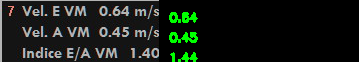

recortes/LAQJP7G21611940132.png
[161, 21] [161, 41]
Número: Missing
Posición: ([97, 3], [161, 21])
---
[161, 41] [121, 62]
Número: 0.52
Posición: ([19, 23], [161, 41])
---
[161, 61] [-1, -1]
Número: 1.53
Posición: ([129, 45], [161, 61])
---


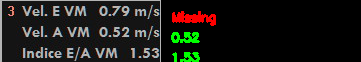

recortes/LAQJ8B0226412016165.png
[53, 27] [-1, -1]
Número: 1.03
Posición: ([23, 11], [53, 27])
---


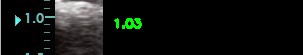

recortes/LAQJ7QO21593140262.png
[159, 21] [159, 41]
Número: 0.68
Posición: ([97, 3], [159, 21])
---
[159, 41] [-1, -1]
Número: 0.50
Posición: ([21, 25], [159, 41])
---


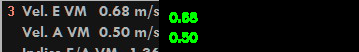

recortes/LAQJNQ8215964021.png
[159, 23] [159, 43]
Número: 0.55
Posición: ([97, 7], [159, 23])
---
[159, 43] [-1, -1]
Número: 1.23
Posición: ([79, 25], [159, 43])
---


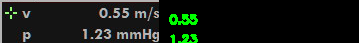

recortes/LAQJLEO21592820220.png
[159, 21] [159, 41]
Número: 0.65
Posición: ([97, 3], [159, 21])
---
[159, 41] [121, 62]
Número: 0.45
Posición: ([19, 23], [159, 41])
---
[159, 61] [-1, -1]
Número: 1.47
Posición: ([129, 45], [159, 61])
---


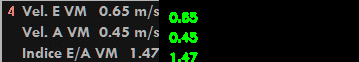

recortes/LAQK5S021431245121.png
[92, 21] [92, 43]
Número: Missing
Posición: ([31, 7], [92, 21])
---
[92, 43] [92, 65]
Número: 3.94
Posición: ([29, 27], [92, 43])
---
[92, 65] [92, 85]
Número: 2.96
Posición: ([29, 45], [92, 65])
---
[92, 85] [92, 103]
Número: Missing
Posición: ([0, 69], [92, 85])
---
[92, 103] [-1, -1]
Número: Missing
Posición: ([39, 91], [92, 103])
---


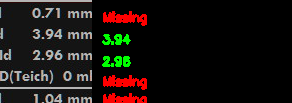

recortes/LAQJ3N0223511616227.png
[55, 23] [55, 65]
Número: 0.53
Posición: ([21, 9], [55, 23])
---
[55, 65] [-1, -1]
Número: Missing
Posición: ([33, 49], [55, 65])
---


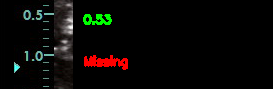

recortes/LAQJK80228964021.png
[121, 23] [215, 29]
Número: 0.07
Posición: ([57, 7], [121, 23])
---
[215, 29] [121, 43]
Número: Missing
Posición: ([183, 15], [215, 29])
---
[121, 43] [-1, -1]
Número: 0.02
Posición: ([21, 27], [121, 43])
---


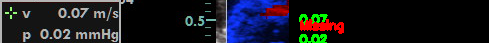

recortes/LAQJ3N021592150118.png
[159, 11] [65, 31]
Número: Missing
Posición: ([133, 0], [159, 11])
---
[159, 31] [91, 55]
Número: 1.40
Posición: ([129, 17], [159, 31])
---
[159, 55] [159, 77]
Número: 0.55
Posición: ([97, 39], [159, 55])
---
[159, 77] [121, 97]
Número: 0.35
Posición: ([21, 57], [159, 77])
---
[159, 97] [-1, -1]
Número: 1.58
Posición: ([129, 81], [159, 97])
---


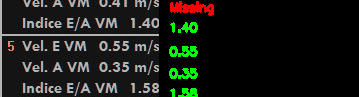

recortes/LAQJ4RO21593030111.png
[159, 21] [159, 41]
Número: 0.54
Posición: ([97, 3], [159, 21])
---
[159, 41] [121, 63]
Número: 0.36
Posición: ([19, 23], [159, 41])
---
[159, 61] [91, 85]
Número: 1.47
Posición: ([129, 45], [159, 61])
---
[159, 85] [159, 107]
Número: 0.56
Posición: ([97, 69], [159, 85])
---
[159, 107] [121, 127]
Número: 0.40
Posición: ([21, 87], [159, 107])
---
[159, 127] [91, 149]
Número: Missing
Posición: ([129, 111], [159, 127])
---
[159, 151] [159, 171]
Número: 0.60
Posición: ([97, 133], [159, 151])
---
[159, 171] [121, 191]
Número: 0.44
Posición: ([21, 155], [159, 171])
---
[159, 191] [-1, -1]
Número: 1.37
Posición: ([129, 177], [159, 191])
---


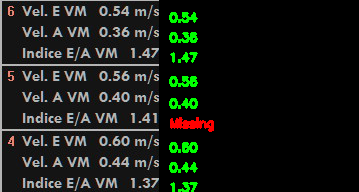

recortes/LAQJNQ821592530197.png
[159, 21] [159, 41]
Número: 0.83
Posición: ([97, 3], [159, 21])
---
[159, 41] [121, 56]
Número: 0.50
Posición: ([19, 23], [159, 41])
---
[121, 56] [-1, -1]
Número: Missing
Posición: ([19, 45], [121, 56])
---


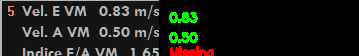

recortes/LAQJP7G21613030262.png
[161, 19] [45, 41]
Número: Missing
Posición: ([109, 5], [161, 19])
---
[161, 41] [-1, -1]
Número: Missing
Posición: ([95, 23], [161, 41])
---


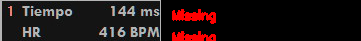

recortes/LAQJJAG21592400197.png
[159, 21] [159, 41]
Número: 0.77
Posición: ([7, 2], [159, 21])
---
[159, 41] [-1, -1]
Número: 0.70
Posición: ([19, 23], [159, 41])
---


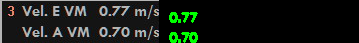

recortes/LAQJ8B021593140266.png
[159, 15] [159, 37]
Número: 0.60
Posición: ([95, 0], [159, 15])
---
[159, 37] [-1, -1]
Número: 0.42
Posición: ([21, 19], [159, 37])
---


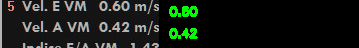

recortes/LAQJ0O82161117067.png
[161, 21] [161, 41]
Número: 0.49
Posición: ([97, 5], [161, 21])
---
[161, 41] [-1, -1]
Número: 0.35
Posición: ([19, 23], [161, 41])
---


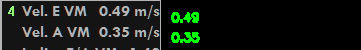

recortes/LAQJ8B0215963020.png
[159, 23] [159, 43]
Número: 0.45
Posición: ([97, 7], [159, 23])
---
[159, 43] [-1, -1]
Número: 0.83
Posición: ([79, 27], [159, 43])
---


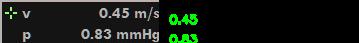

recortes/LAQJ2Q8241812514612.png
[71, 79] [-1, -1]
Número: Missing
Posición: ([49, 65], [71, 79])
---


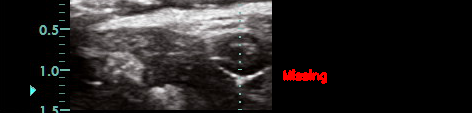

recortes/LAQJ3N02159116027.png
[159, 17] [159, 37]
Número: 0.53
Posición: ([95, 0], [159, 17])
---
[159, 37] [121, 59]
Número: 0.41
Posición: ([19, 19], [159, 37])
---
[159, 59] [91, 81]
Número: 1.29
Posición: ([129, 41], [159, 59])
---
[159, 81] [-1, -1]
Número: 0.57
Posición: ([97, 65], [159, 81])
---


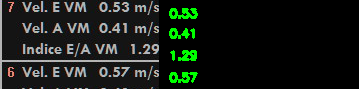

recortes/LAQINS021431242346.png
[120, 19] [35, 41]
Número: 1.15
Posición: ([59, 5], [120, 19])
---
[120, 41] [43, 61]
Número: 2.46
Posición: ([59, 25], [120, 41])
---
[120, 61] [33, 78]
Número: 1.37
Posición: ([59, 45], [120, 61])
---
[120, 78] [-1, -1]
Número: Missing
Posición: ([59, 67], [120, 78])
---


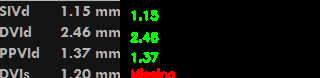

recortes/LAQINK8236612114621.png
[69, 29] [-1, -1]
Número: Missing
Posición: ([37, 15], [69, 29])
---


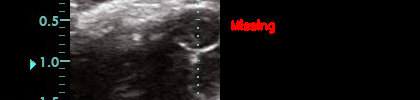

recortes/LAQJ0O821613140278.png
[161, 25] [-1, -1]
Número: Missing
Posición: ([97, 7], [161, 25])
---


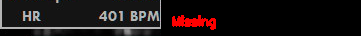

recortes/LAQJ42G215964021.png
[159, 23] [159, 43]
Número: 0.43
Posición: ([97, 7], [159, 23])
---
[159, 43] [-1, -1]
Número: Missing
Posición: ([79, 27], [159, 43])
---


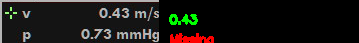

recortes/LAQJ4RO2159111067.png
[159, 21] [45, 41]
Número: Missing
Posición: ([109, 5], [159, 21])
---
[159, 41] [-1, -1]
Número: Missing
Posición: ([97, 25], [159, 41])
---


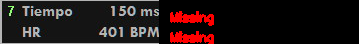

recortes/LAQJ298214336223299.png
[120, 27] [35, 49]
Número: Missing
Posición: ([83, 9], [120, 27])
---
[120, 49] [64, 62]
Número: Missing
Posición: ([83, 31], [120, 49])
---
[120, 62] [-1, -1]
Número: Missing
Posición: ([90, 54], [120, 62])
---


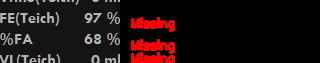

recortes/LAQK5P8228612414621.png
[61, 29] [-1, -1]
Número: Missing
Posición: ([37, 15], [61, 29])
---


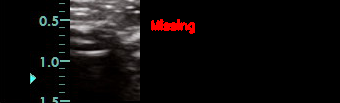

recortes/LAQINK821441212321.png
[121, 21] [35, 43]
Número: 0.00
Posición: ([59, 7], [121, 21])
---
[121, 43] [43, 65]
Número: 1.48
Posición: ([59, 27], [121, 43])
---
[121, 65] [33, 85]
Número: 2.35
Posición: ([57, 45], [121, 65])
---
[121, 85] [84, 100]
Número: 0.00
Posición: ([59, 69], [121, 85])
---
[121, 100] [-1, -1]
Número: Missing
Posición: ([89, 89], [121, 100])
---


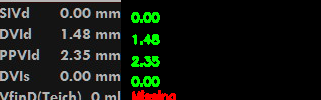

recortes/LAQJJO023632320121.png
[121, 15] [-1, -1]
Número: Missing
Posición: ([79, 0], [121, 15])
---


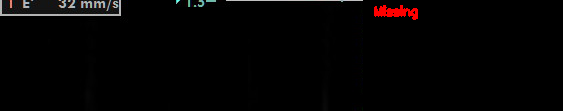

recortes/LAQJF282418120310.png
[73, 25] [185, 51]
Número: 10.55
Posición: ([0, 13], [73, 25])
---
[185, 51] [187, 91]
Número: 0.53
Posición: ([153, 35], [185, 51])
---
[187, 91] [-1, -1]
Número: 1.05
Posición: ([153, 77], [187, 91])
---


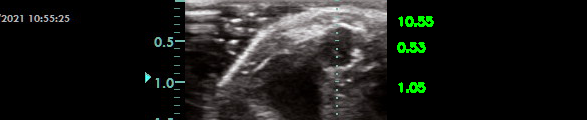

recortes/LAQJ998228066046.png
[135, 20] [-1, -1]
Número: Missing
Posición: ([71, 5], [135, 20])
---


recortes/LAQJLEO2159111067.png
[159, 21] [45, 41]
Número: Missing
Posición: ([109, 5], [159, 21])
---
[159, 41] [-1, -1]
Número: Missing
Posición: ([97, 25], [159, 41])
---


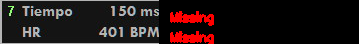

In [14]:
import re



carpeta_imagenes = 'recortes'
carpeta_texto = 'recortes_texto'

# Obtener la lista de archivos en la carpeta de imágenes DICOM
archivos = os.listdir(carpeta_imagenes)

# Procesar cada imagen DICOM
for archivo in archivos:
    if archivo[-3:] == "png":
      # Ruta completa al archivo DICOM
      ruta = os.path.join(carpeta_imagenes, archivo)
      # images
      result = reader.readtext(ruta)
      if result:
        print(ruta)
        imagen = cv2.imread(ruta)

        patron_numerico = re.compile(r"[-+]?\d+\.\d{2}")
        numeros = []

        for resultado in result:
            texto = resultado[1]
            coincidencias = patron_numerico.findall(texto)
            for coincidencia in coincidencias:
                inicio = resultado[0][0]
                fin = resultado[0][2]
                numeros.append((coincidencia, inicio, fin))
            if not coincidencias:
                coincidencia = "Missing"
                inicio = resultado[0][0]
                fin = resultado[0][2]
                numeros.append((coincidencia, inicio, fin))

        # Crear una nueva imagen con área negra a la derecha
        alto, ancho, _ = imagen.shape
        nueva_imagen = np.zeros((alto, ancho + 200, 3), np.uint8)
        nueva_imagen[:, :ancho] = imagen

        # Agregar el texto en el área negra de la nueva imagen
        # for numero, inicio, fin in numeros:
        for i in range(len(numeros)):
            texto = numeros[i][0]
            inicio =  numeros[i][1]
            fin =  numeros[i][2]
            if i < (len(numeros) -1):
              fin_next = numeros[i+1][2]
            if i == (len(numeros) -1):
              fin_next = [-1,-1]

            posicion = (ancho + 10, int(fin[1]))  # Coordenadas (x, y) de la posición del texto
            fuente = cv2.FONT_HERSHEY_SIMPLEX
            escala = 0.4
            color = (0, 255, 0)  # Color en formato BGR (en este caso, verde)
            if texto == "Missing":
              color = (0, 0, 255) # Rojo

            if not (((fin_next[1] - 5) <= fin[1]) and ( fin[1] <= fin_next[1] + 5) and texto == "Missing"):
              print(fin,fin_next)
              # Añadir el texto a la imagen
              cv2.putText(nueva_imagen, texto, posicion, fuente, escala, color, thickness=2)
              print(f"Número: {texto}")
              print(f"Posición: ({inicio}, {fin})")
              print("---")

          # Mostrar la nueva imagen con el texto añadido
        cv2_imshow(nueva_imagen)
        nombre_archivo = f"texto_{archivo}"
        ruta_texto = os.path.join(carpeta_texto, nombre_archivo)
        cv2.imwrite(ruta_texto, nueva_imagen)

In [6]:
ruta_carpetas = '/content/Introduccion-Imagenes/Tarea_3_resultados/hough_recortes'
ruta_pacientes = '/content/Introduccion-Imagenes/Imagenes DICOM'


In [8]:
def crear_carpeta_paciente(ruta_paciente,patient_id):

  if not os.path.exists(ruta_paciente):
      os.makedirs(ruta_paciente)
      print("Carpeta creada para el paciente:", patient_id)
  else:
      print("La carpeta ya existe para el paciente:", patient_id)


In [9]:
ruta_carpetas = [
    '/content/recortes_texto',
    '/content/recortes',
    '/content/hough_recortes'
]

archivos = os.listdir(ruta_pacientes)
for archivo in archivos:
    ruta_archivo = os.path.join(ruta_pacientes, archivo)

    try:
        ds = pydicom.dcmread(ruta_archivo)
        patient_id = ds.PatientID
        ruta_paciente = f"/content/Pacientes/{patient_id}"
        crear_carpeta_paciente(ruta_paciente, patient_id)
        print("Nombre del paciente:", patient_id)

        # Verificar si existen archivos en ruta_carpetas que contengan el string de archivo
        for ruta_carpeta in ruta_carpetas:
            archivos_ruta = os.listdir(ruta_carpeta)
            tipo_carpeta = ruta_carpeta.split("/")[-1]
            ruta_tipo_carpeta = os.path.join(ruta_paciente, tipo_carpeta)
            crear_carpeta_paciente(ruta_tipo_carpeta, patient_id)
            for archivo_ruta in archivos_ruta:
                if archivo in archivo_ruta:
                    # Mover archivo a la carpeta del paciente
                    ruta_origen = os.path.join(ruta_carpeta, archivo_ruta)
                    shutil.move(ruta_origen, ruta_tipo_carpeta)
                    print(f"Archivo {archivo_ruta} movido a la carpeta del paciente:", patient_id)

    except Exception as e:
        print("Error al leer el archivo:", archivo)
        print(e)

Carpeta creada para el paciente: 194
Nombre del paciente: 194
Carpeta creada para el paciente: 194
Archivo Hough_LAQISAO2105119046.png movido a la carpeta del paciente: 194
Archivo Hough_LAQISAO21053140121.png movido a la carpeta del paciente: 194
Carpeta creada para el paciente: 194
Archivo LAQISAO21053140121.png movido a la carpeta del paciente: 194
Archivo LAQISAO2105119046.png movido a la carpeta del paciente: 194
Carpeta creada para el paciente: 194
Archivo texto_LAQISAO2105119046.png movido a la carpeta del paciente: 194
Archivo texto_LAQISAO21053140121.png movido a la carpeta del paciente: 194
La carpeta ya existe para el paciente: 194
Nombre del paciente: 194
La carpeta ya existe para el paciente: 194
Archivo Hough_LAQIS1G23076416121.png movido a la carpeta del paciente: 194
Archivo Hough_LAQIS1G2383395309316.png movido a la carpeta del paciente: 194
Archivo Hough_LAQIS1G2161120067.png movido a la carpeta del paciente: 194
Archivo Hough_LAQIS1G216164021.png movido a la carpeta 

In [10]:


# Nombre de la carpeta que deseas descargar
carpeta_descargar = '/content/Pacientes'

# Comprimir la carpeta en un archivo ZIP
shutil.make_archive(carpeta_descargar, 'zip', carpeta_descargar)

# Descargar el archivo ZIP
files.download(f"{carpeta_descargar}.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>